In [1]:
import gym
import numpy as np
import torch

from stable_baselines3 import SAC, PPO, HerReplayBuffer
from stable_baselines3.common.buffers import DictReplayBuffer
from stable_baselines3.sac.policies import MlpPolicy
from stable_baselines3.common.vec_env import DummyVecEnv, SubprocVecEnv, VecNormalize
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.utils import set_random_seed
from stable_baselines3.common.monitor import Monitor

from stable_baselines3.common import results_plotter
from stable_baselines3.common.results_plotter import load_results, ts2xy, plot_results
from stable_baselines3.common.noise import NormalActionNoise
from stable_baselines3.common.callbacks import BaseCallback

import numpy as np
import gym

from newLorenzEnv import Lorenz63Env
# from newLorenzEnvICs import Lorenz63Env
from stable_baselines3 import PPO
import time 
import matplotlib.pyplot as plt
from typing import Callable

import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0"

from stable_baselines3.common.evaluation import evaluate_policy

In [2]:
def make_env(env_id, rank, seed=0):
    """
    Utility function for multiprocessed env.

    :param env_id: (str) the environment ID
    :param num_env: (int) the number of environments you wish to have in subprocesses
    :param seed: (int) the inital seed for RNG
    :param rank: (int) index of the subprocess
    """
    def _init():
        env = Lorenz63Env(integ_steps = 50)
        env.seed(seed + rank)
        return env
    set_random_seed(seed+ rank)
    return _init

In [3]:
num_cpu = 70  # Number of processes to use
# Create the vectorized environment
env = SubprocVecEnv([make_env('Lorenz', rank=i) for i in range(num_cpu)])
env = VecNormalize(env, norm_obs=True, norm_reward=False)

torch.backends.cudnn.benchmark = True

# neurons128_LR0.0001_Gamma0.1_BS100_totSteps5000000_assimStep50_obsNosie1.0_maxgradnorm0.8_vfcoeff0.8
# neurons128_LR0.0001_Gamma0.1_BS100_totSteps5000000_assimStep50_obsNosie1.0_maxgradnorm0.8_vfcoeff0.9
# neurons128_LR0.0001_Gamma0.1_BS100_totSteps5000000_assimStep50_obsNosie1.0_maxgradnorm0.9_vfcoeff0.9
# neurons128_LR0.0001_Gamma0.2_BS100_totSteps5000000_assimStep50_obsNosie1.0_maxgradnorm0.8_vfcoeff0.8
# neurons128_LR0.0001_Gamma0.05_BS100_totSteps5000000_assimStep50_obsNosie1.0_maxgradnorm0.8_vfcoeff0.8
# neurons128_LR0.0001_Gamma0.05_BS100_totSteps5000000_assimStep50_obsNosie1.0_maxgradnorm0.8_vfcoeff0.9

# neurons128_LR0.0001_Gamma0.8_BS100_totSteps5000000_assimStep50_obsNosie1.0_maxgradnorm0.8_vfcoeff0.9
# neurons128_LR0.0001_Gamma0.8_BS100_totSteps5000000_assimStep50_obsNosie1.0_maxgradnorm0.9_vfcoeff0.9

# neurons128_LR0.0001_Gamma0.9_BS100_totSteps5000000_assimStep50_obsNosie1.0_maxgradnorm0.8_vfcoeff0.9
# neurons128_LR0.0001_Gamma0.9_BS100_totSteps5000000_assimStep50_obsNosie1.0_maxgradnorm0.9_vfcoeff0.8

neuron = 128
lr = 0.0001
gamma = 0.9
tSteps = 5000000
bs = 100
vf = 0.8
max_grad_norms = 0.9


In [4]:

model = PPO.load('trainedModels_assimSteps50_obsNosie1.0_vAction/'+'neurons'+str(neuron)+'_LR'+str(lr)+'_Gamma'+str(gamma)+'_BS'+str(bs)+'_totSteps'+str(tSteps)+'_assimStep50_obsNosie1.0_maxgradnorm'+str(max_grad_norms)+'_vfcoeff'+str(vf)+'/'+'PPO_Lorenz63', env=env)
obs = env.reset()

solution = []
ref_soln = []
rewards_ = []

for _ in range(int(1000)):
    # action, _states = model.predict(obs, deterministic=True)
    action, _states = model.predict(obs, deterministic=False)
    obs, rewards, dones, info = env.step(action)
    trueObs = env.get_original_obs()
    trueRew = env.get_original_reward()
    trueRef = env.env_method("_get_ref", 1)

    solution.append(trueObs)
    ref_soln.append(trueRef)
    rewards_.append(trueRew)

sol2 = np.asarray(solution)
solR = np.asarray(ref_soln)


[0.34583978 0.34037953 0.33500732 ... 0.14366955 0.14317661 0.14269352]


<Figure size 640x480 with 0 Axes>

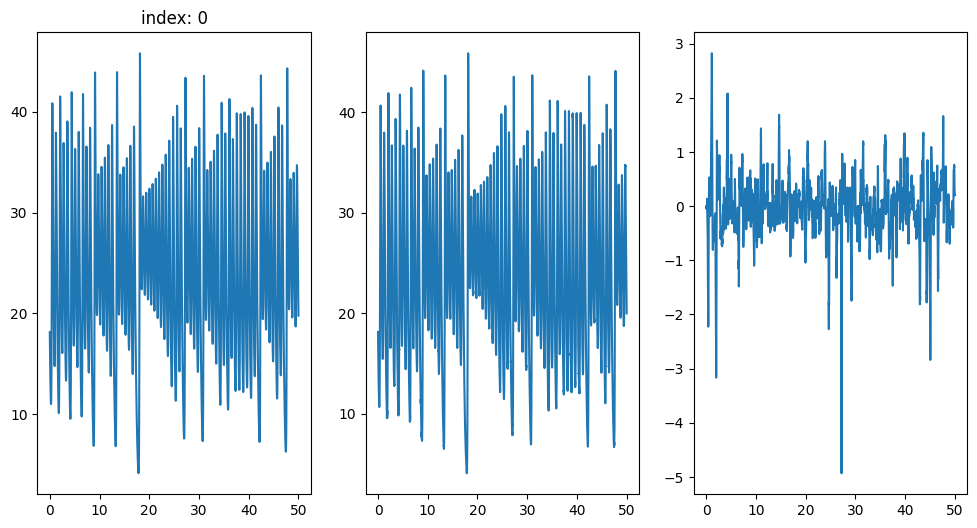

[0.19322391 0.19083852 0.18850106 ... 0.29515361 0.29371215 0.29240703]


<Figure size 640x480 with 0 Axes>

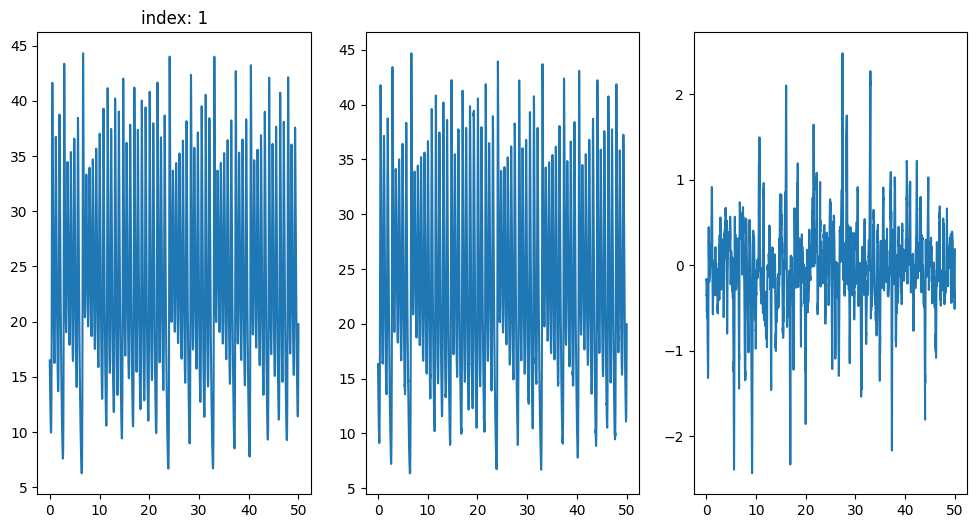

[0.21387174 0.21079067 0.20777054 ... 0.50631705 0.50437288 0.50248235]


<Figure size 640x480 with 0 Axes>

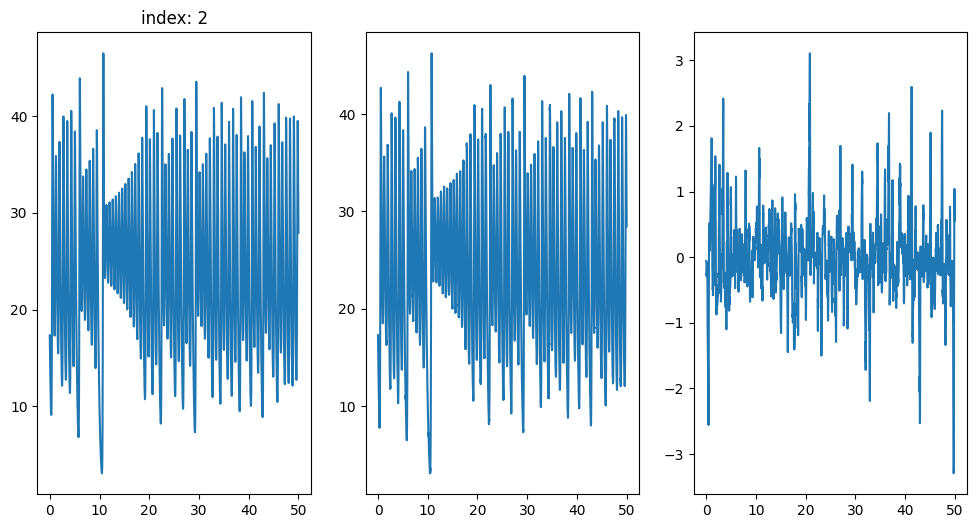

[0.13166145 0.13008778 0.12855748 ... 0.13652371 0.13613515 0.13576924]


<Figure size 640x480 with 0 Axes>

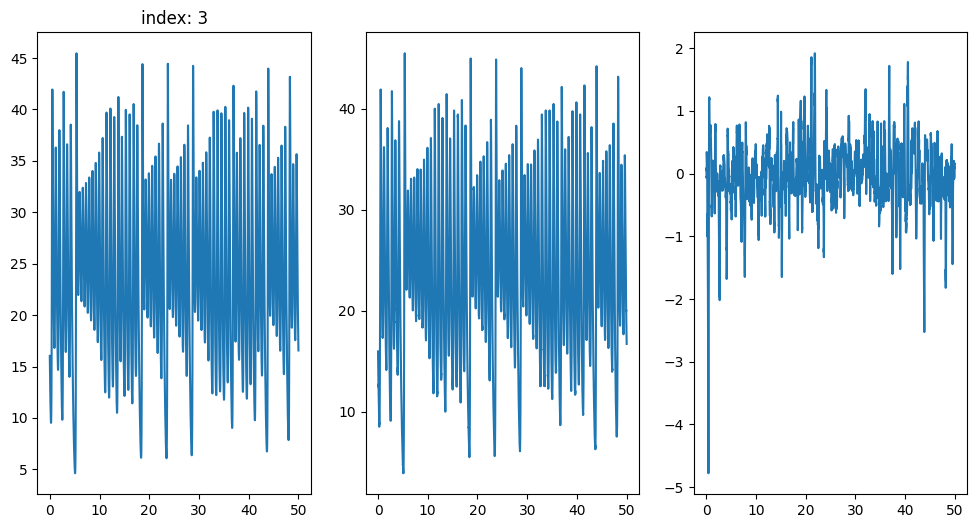

[0.26513169 0.26390827 0.26277437 ... 0.13249208 0.1321919  0.13189653]


<Figure size 640x480 with 0 Axes>

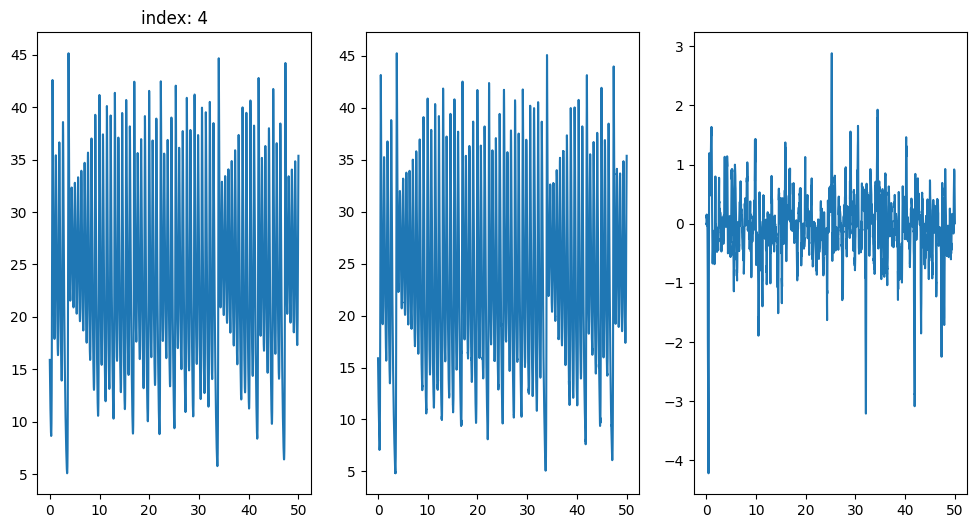

[0.04033034 0.0403745  0.04042117 ... 1.31598663 1.32710321 1.33832401]


<Figure size 640x480 with 0 Axes>

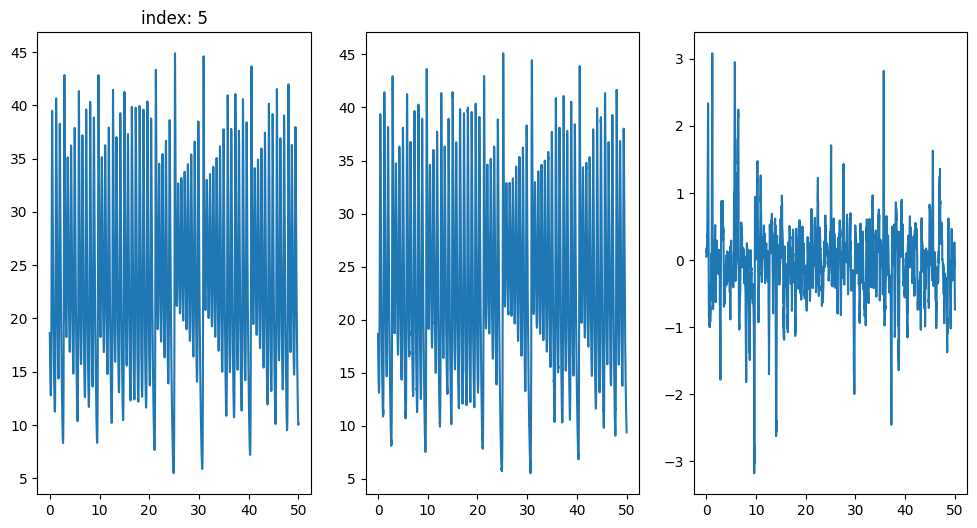

[0.05430956 0.05432897 0.05435706 ... 0.28407539 0.28425085 0.28446837]


<Figure size 640x480 with 0 Axes>

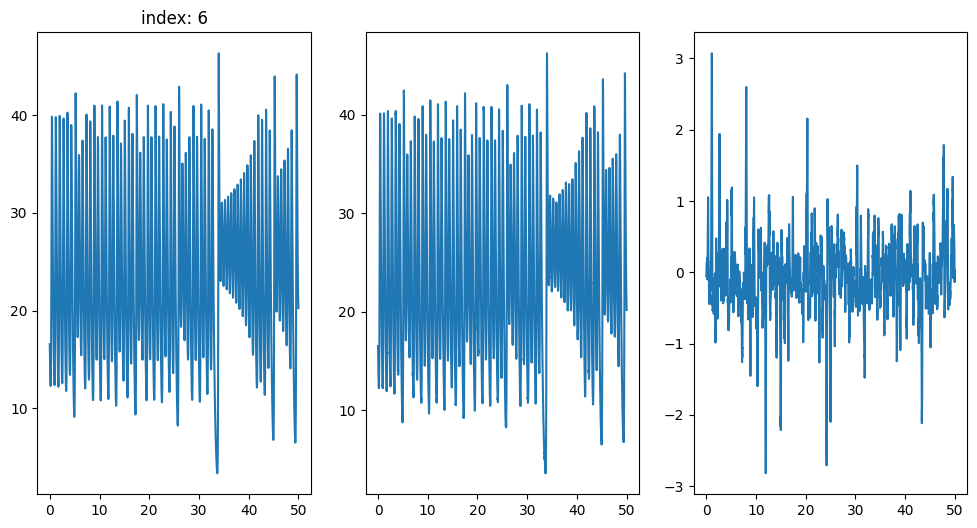

[0.10916224 0.10926861 0.10939007 ... 0.28702262 0.28691532 0.28681579]


<Figure size 640x480 with 0 Axes>

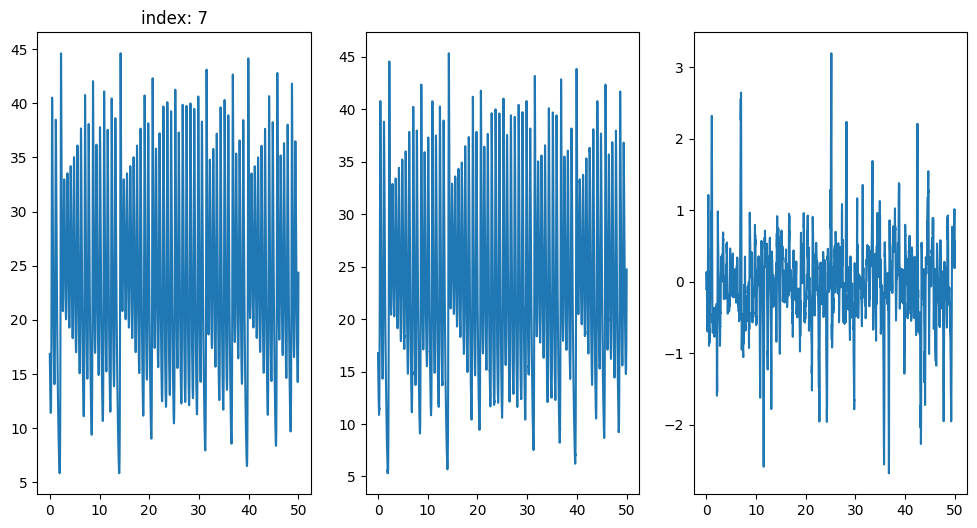

[0.13129615 0.13051653 0.12975044 ... 0.21750111 0.21646452 0.21543769]


<Figure size 640x480 with 0 Axes>

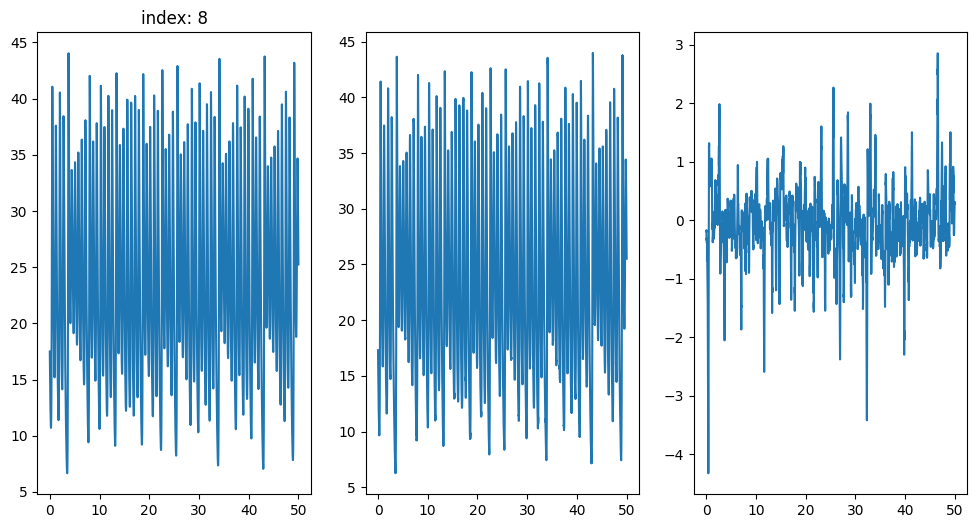

[0.22690843 0.2239309  0.22100754 ... 0.61595965 0.62024738 0.62458145]


<Figure size 640x480 with 0 Axes>

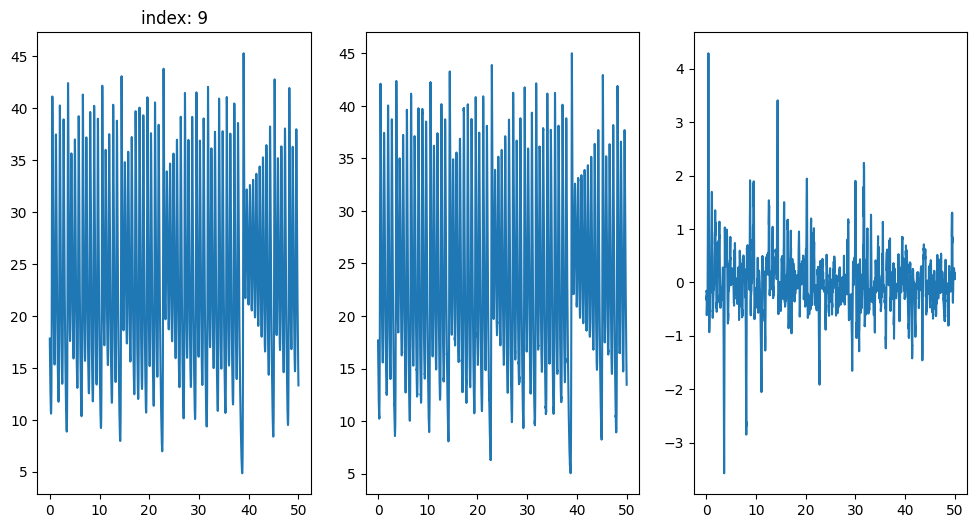

[0.19269993 0.1911413  0.18964247 ... 0.44162119 0.44458939 0.44759116]


<Figure size 640x480 with 0 Axes>

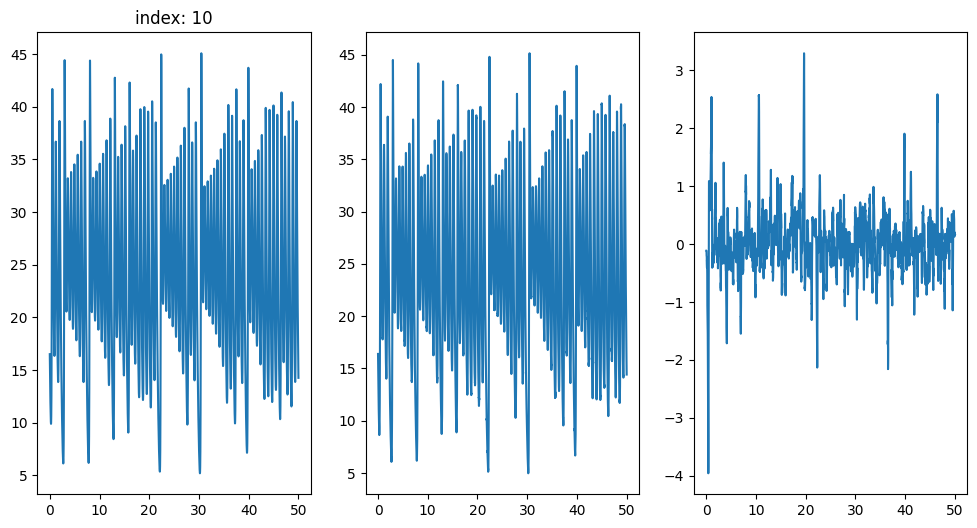

[0.1232025  0.1214406  0.11970776 ... 0.28299883 0.28196367 0.28101159]


<Figure size 640x480 with 0 Axes>

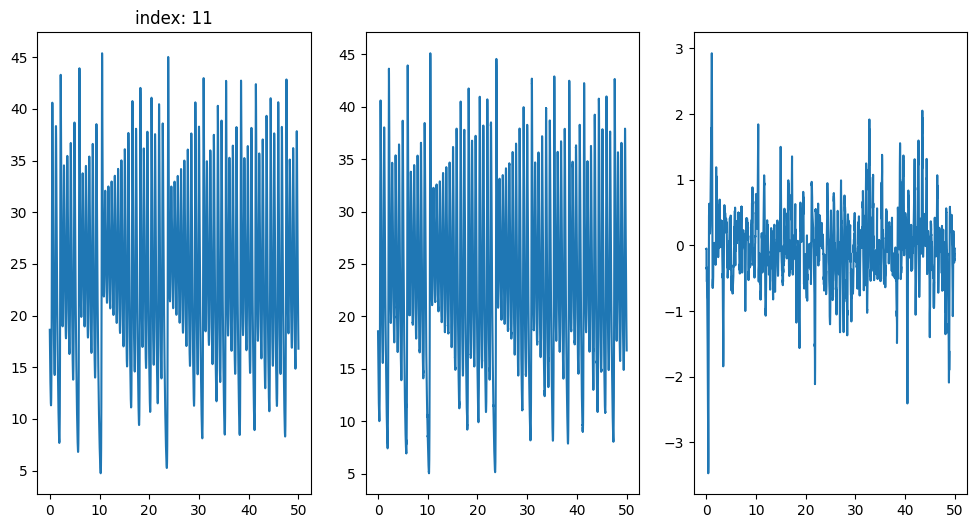

[0.09991463 0.09833503 0.09678213 ... 0.170236   0.16977397 0.16931867]


<Figure size 640x480 with 0 Axes>

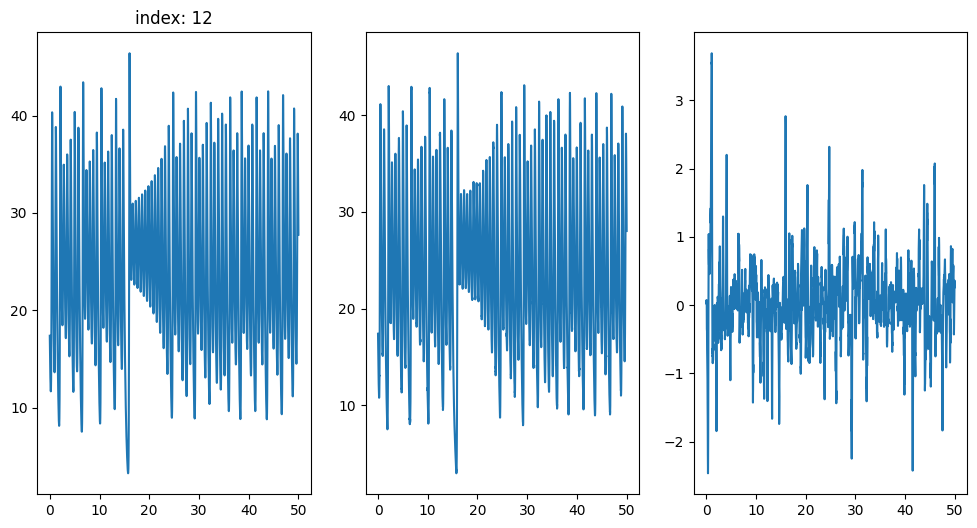

[0.10172492 0.10070324 0.09970409 ... 0.11793137 0.1169242  0.11592733]


<Figure size 640x480 with 0 Axes>

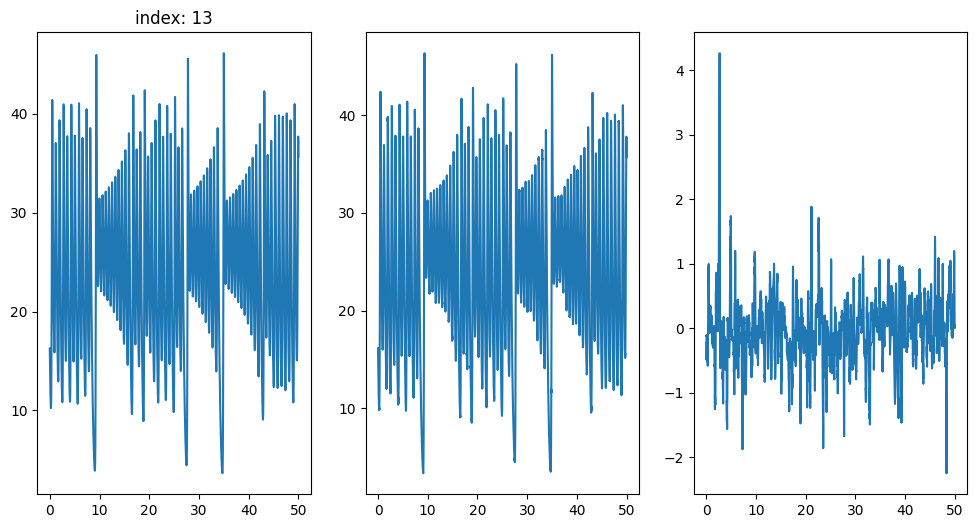

[0.14159449 0.1416859  0.14180679 ... 0.38165653 0.38266748 0.38368368]


<Figure size 640x480 with 0 Axes>

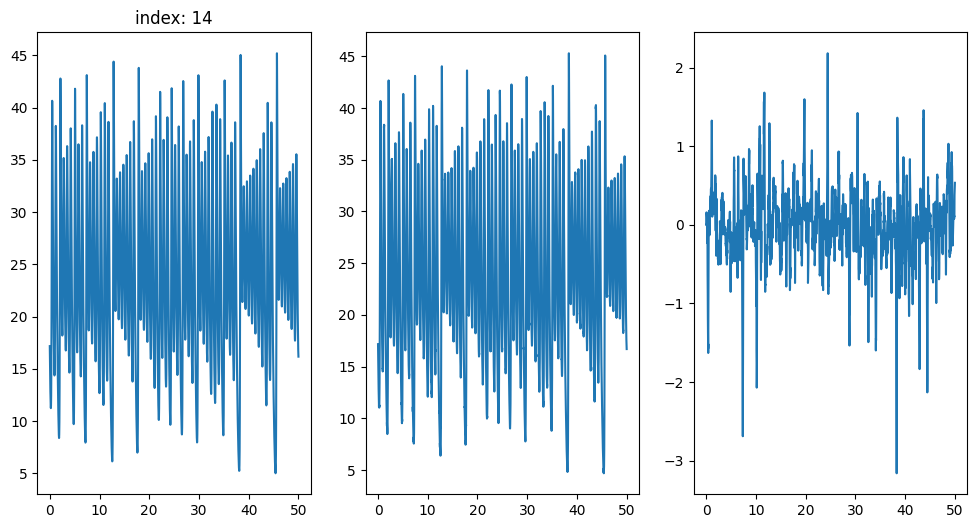

[0.20652467 0.20552215 0.20457927 ... 0.23837702 0.2405586  0.24276444]


<Figure size 640x480 with 0 Axes>

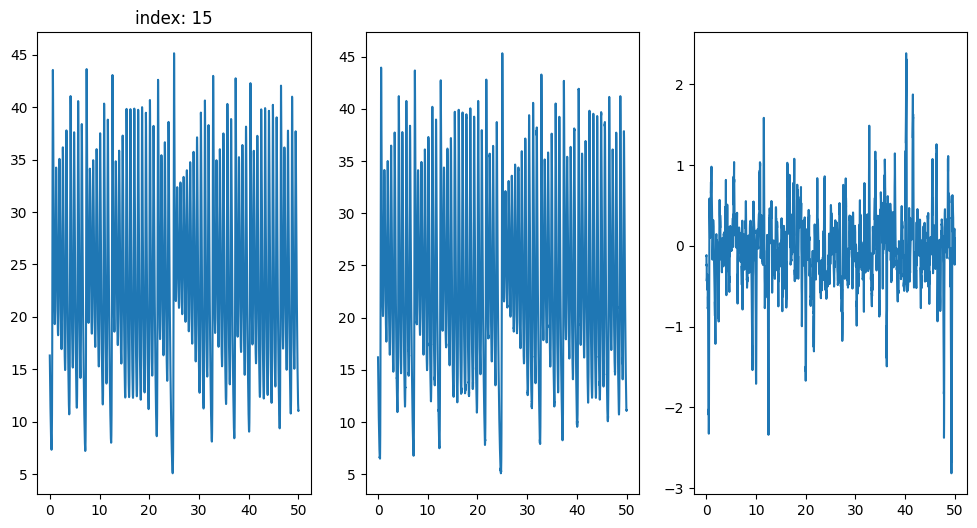

[0.14643919 0.14573216 0.14505722 ... 0.73568576 0.73768591 0.73972115]


<Figure size 640x480 with 0 Axes>

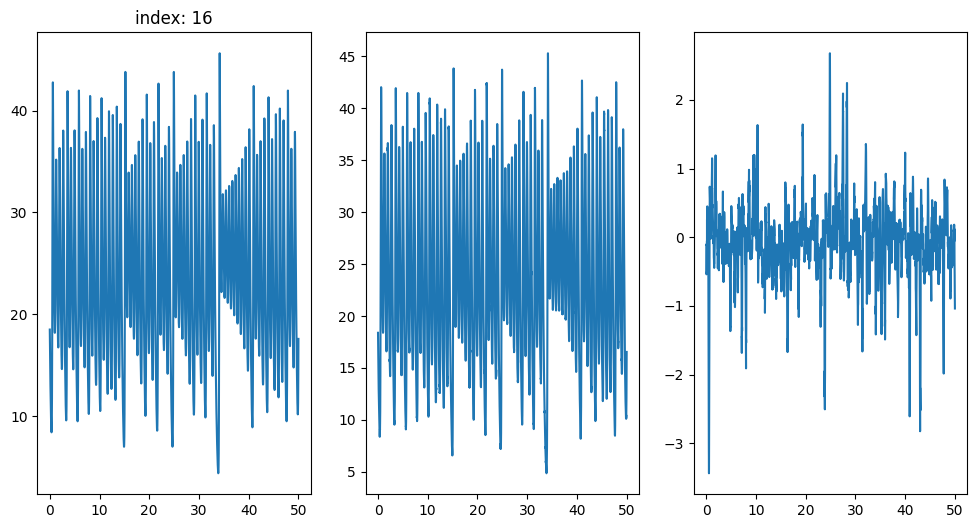

[0.09873643 0.097565   0.09641987 ... 0.27153133 0.26957509 0.26765129]


<Figure size 640x480 with 0 Axes>

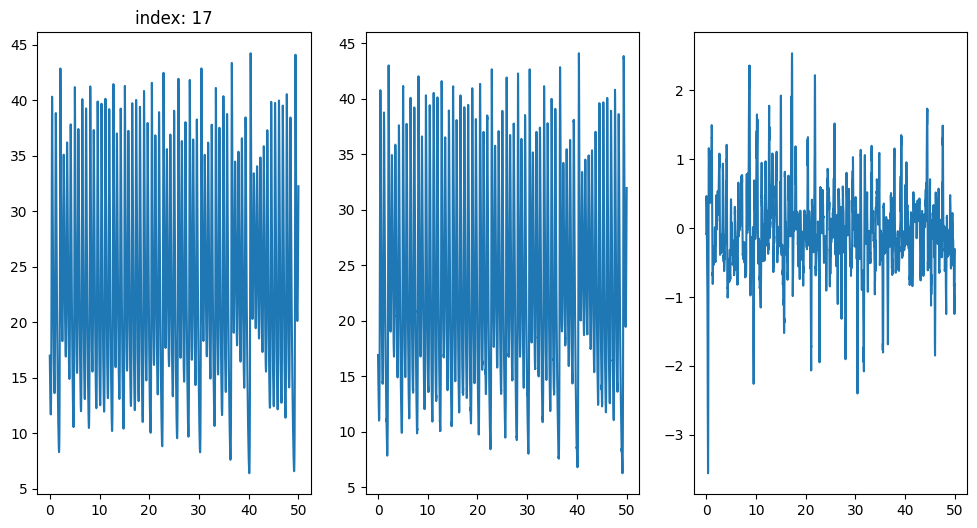

[0.11863393 0.11680658 0.11500706 ... 0.95426562 0.96259651 0.97102166]


<Figure size 640x480 with 0 Axes>

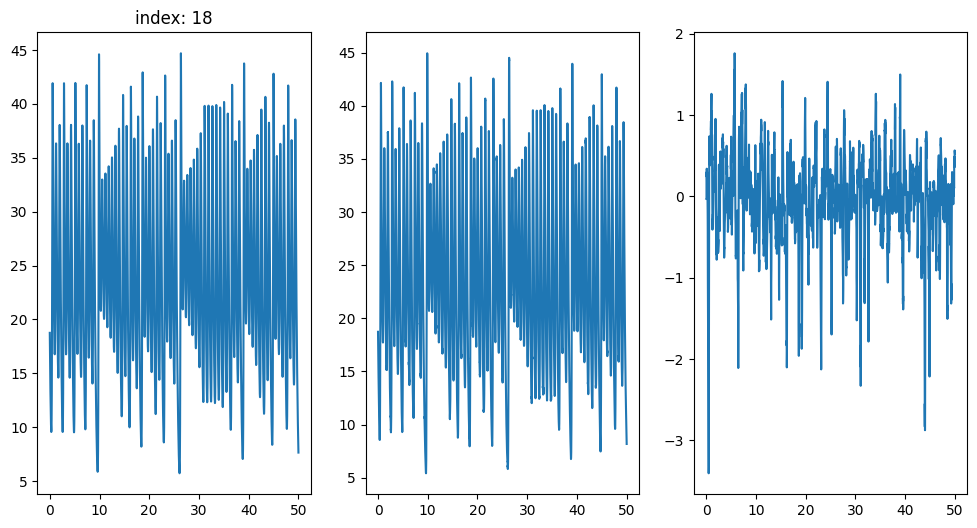

[0.09414019 0.09362661 0.09312533 ... 0.78530625 0.78777504 0.79018671]


<Figure size 640x480 with 0 Axes>

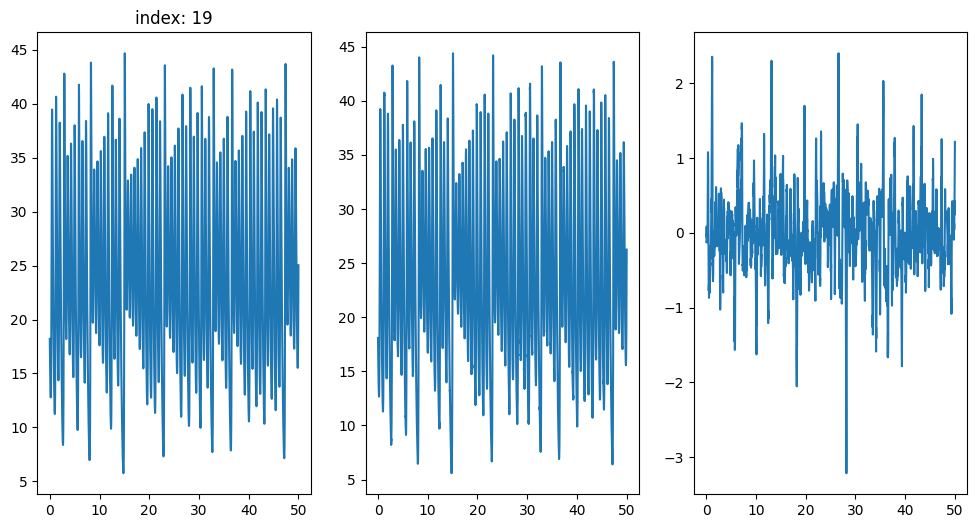

[0.30646024 0.30196217 0.29754233 ... 0.26488669 0.26451876 0.26418293]


<Figure size 640x480 with 0 Axes>

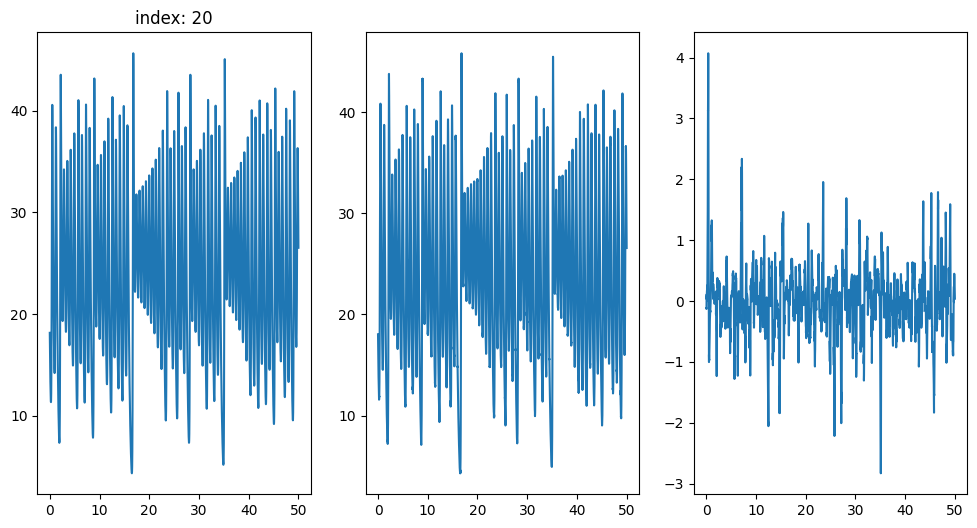

[0.11374332 0.11353863 0.11334015 ... 0.45971917 0.46112241 0.46255475]


<Figure size 640x480 with 0 Axes>

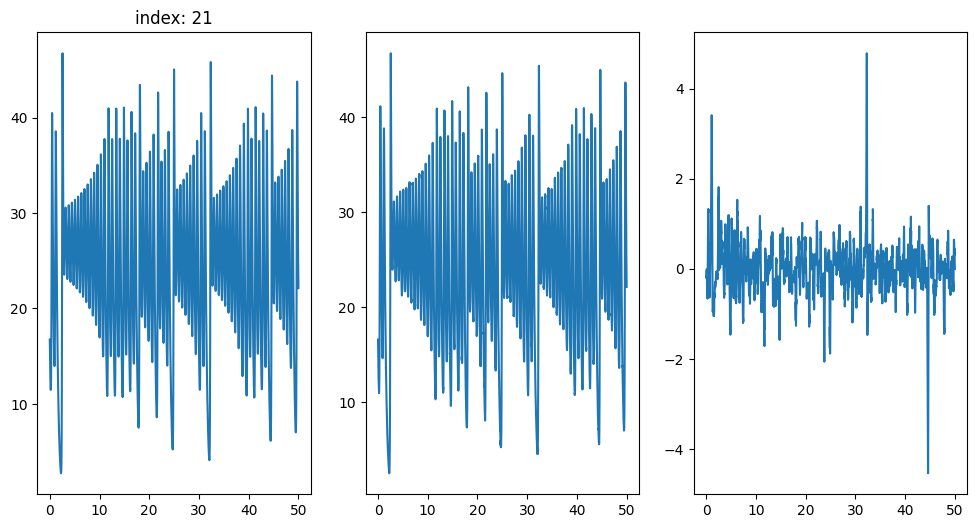

[0.12040216 0.12020474 0.12001013 ... 0.6045527  0.60623557 0.60795423]


<Figure size 640x480 with 0 Axes>

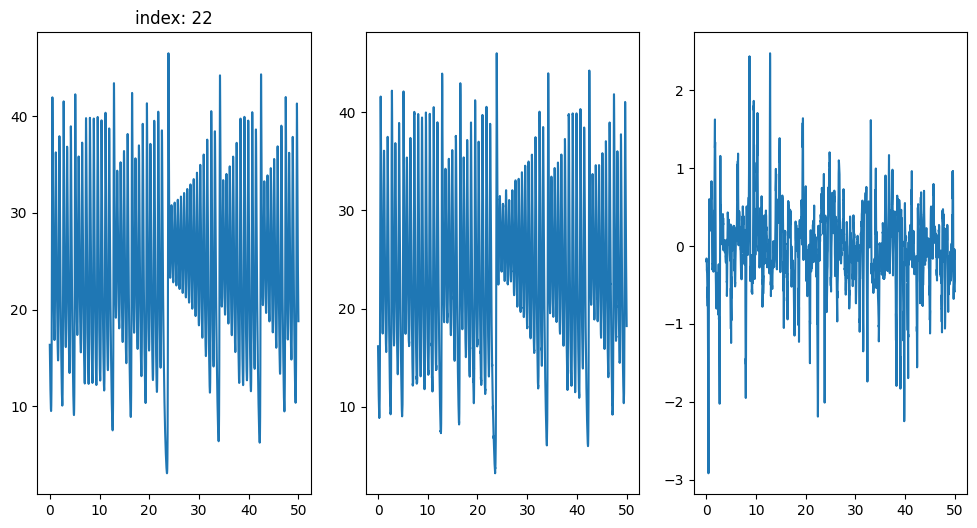

[0.11954546 0.1181455  0.11677572 ... 0.07969576 0.07927065 0.07885319]


<Figure size 640x480 with 0 Axes>

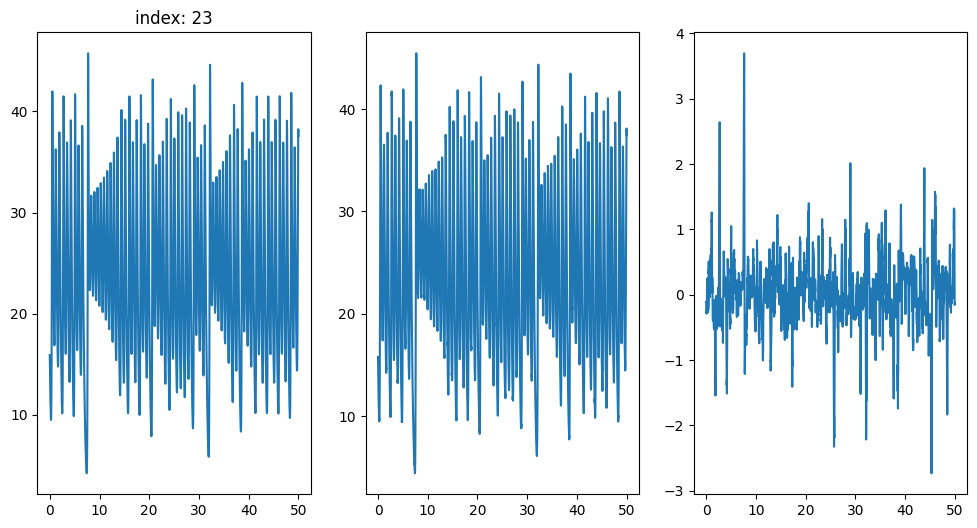

[0.14531387 0.14401614 0.14275872 ... 0.27366551 0.27373958 0.27383743]


<Figure size 640x480 with 0 Axes>

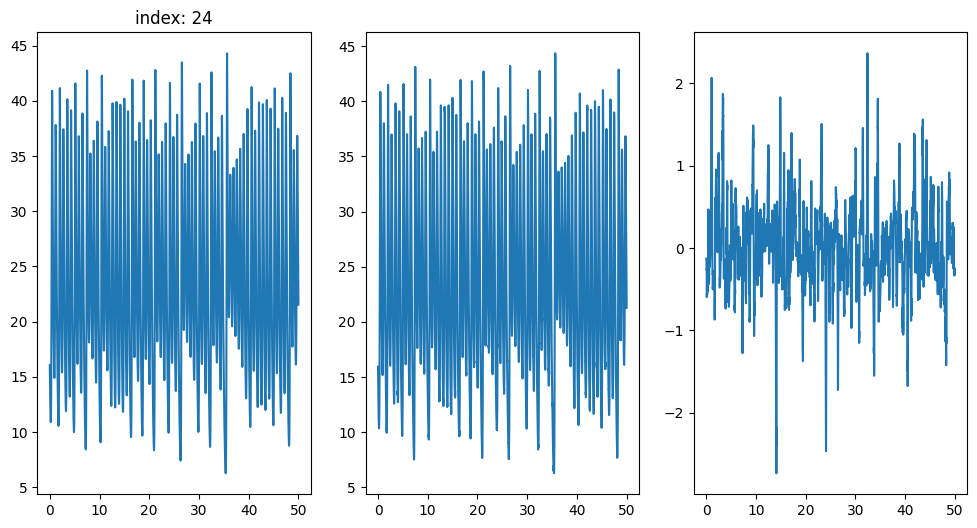

[0.24271666 0.24184587 0.24104549 ... 0.12646353 0.12608043 0.12570945]


<Figure size 640x480 with 0 Axes>

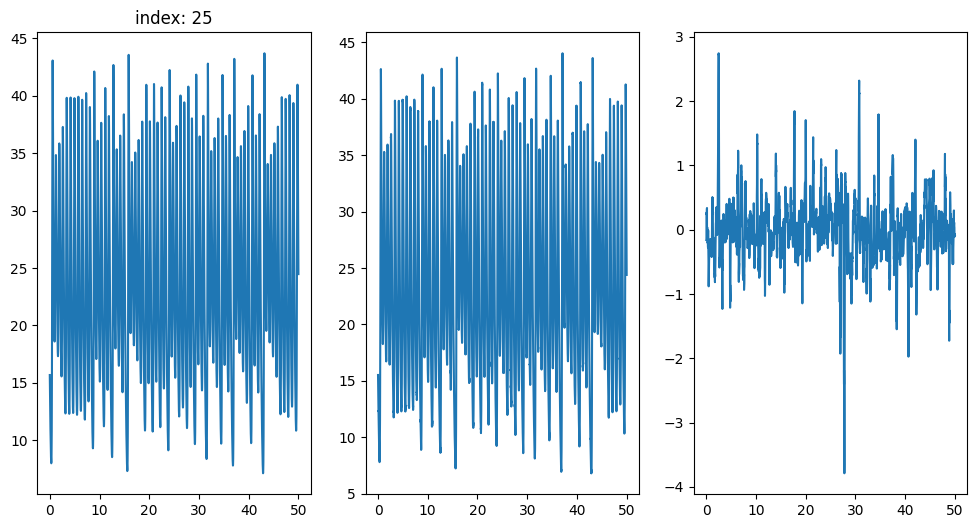

[0.13832509 0.13689923 0.13550486 ... 0.09212421 0.09206949 0.09201663]


<Figure size 640x480 with 0 Axes>

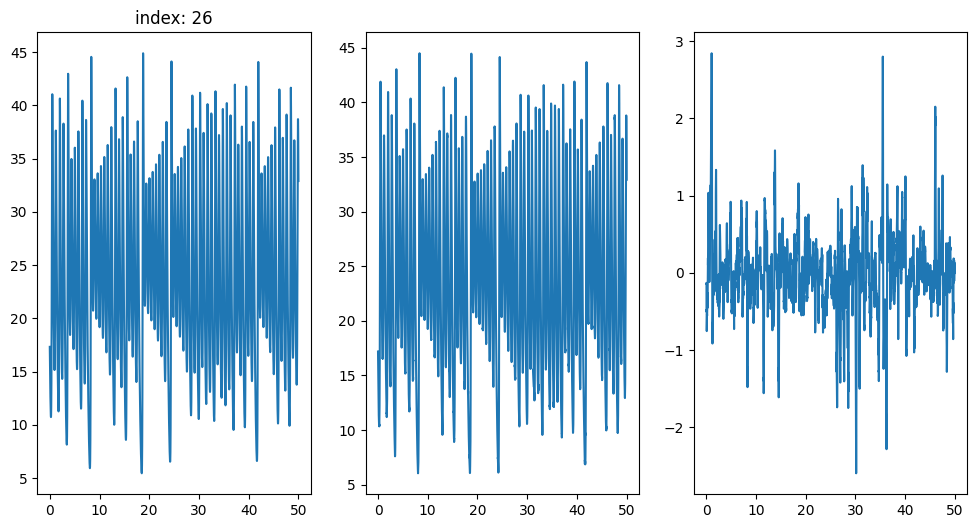

[0.13598301 0.13520176 0.1344664  ... 0.20119054 0.1995754  0.19799671]


<Figure size 640x480 with 0 Axes>

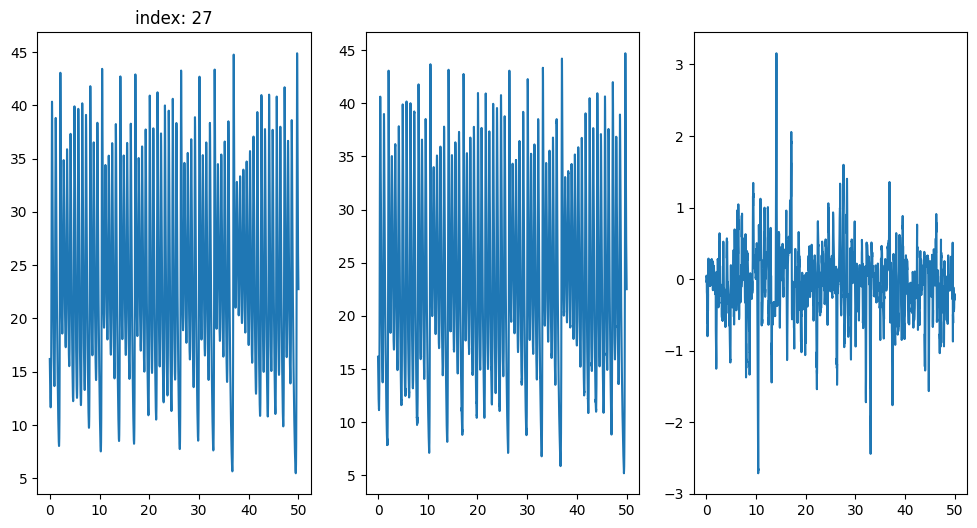

[0.12324988 0.12149017 0.11976204 ... 0.47575168 0.47533549 0.47502953]


<Figure size 640x480 with 0 Axes>

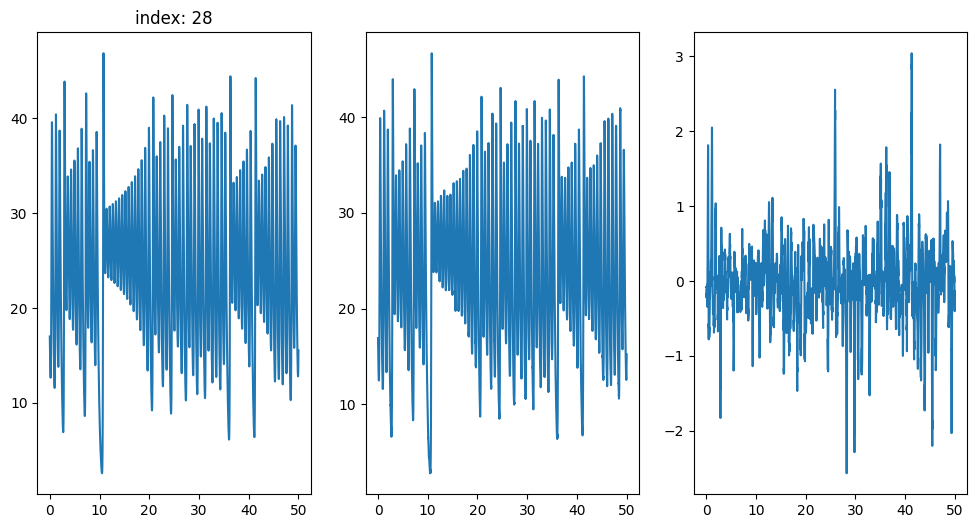

[0.23453434 0.2357028  0.23688665 ... 0.60972924 0.60829658 0.60684507]


<Figure size 640x480 with 0 Axes>

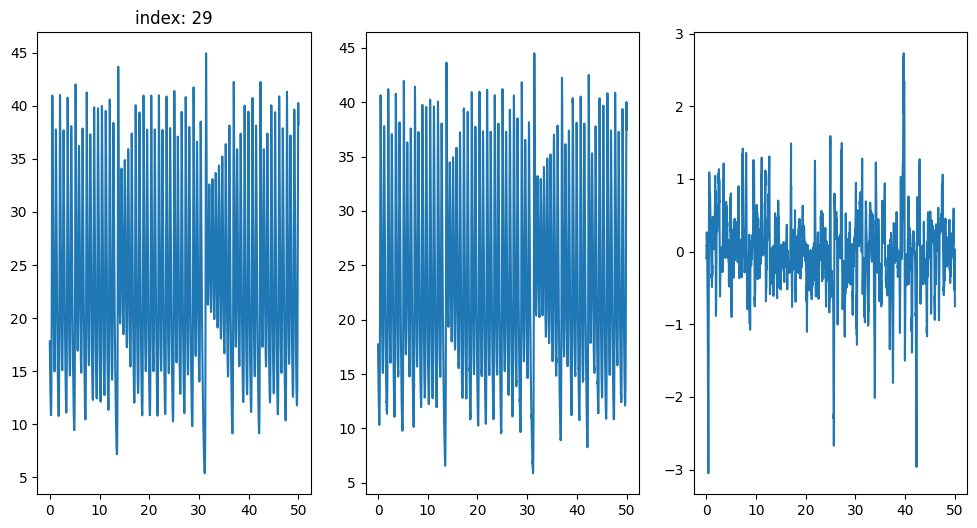

[0.13888117 0.13748422 0.13611606 ... 0.42694188 0.42591521 0.42491299]


<Figure size 640x480 with 0 Axes>

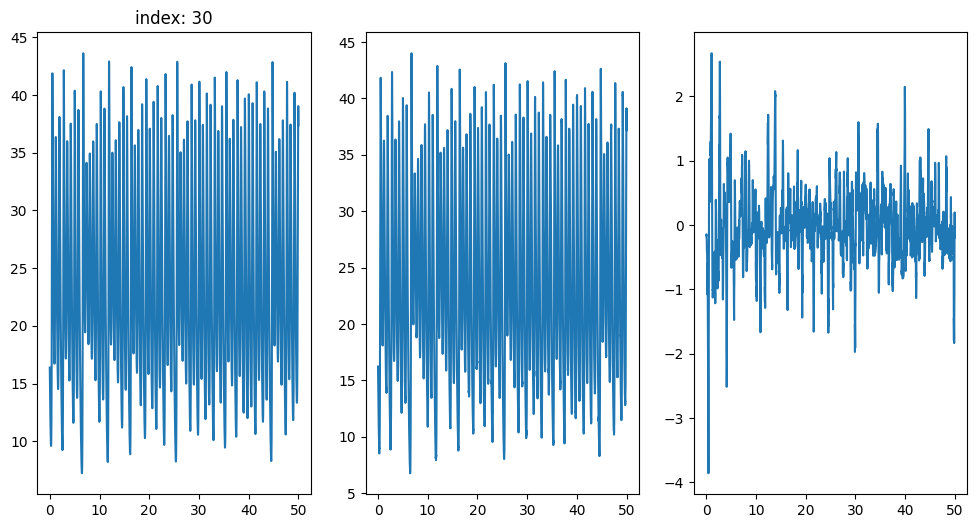

[0.26517145 0.26340739 0.26171005 ... 0.12916372 0.12956488 0.12997072]


<Figure size 640x480 with 0 Axes>

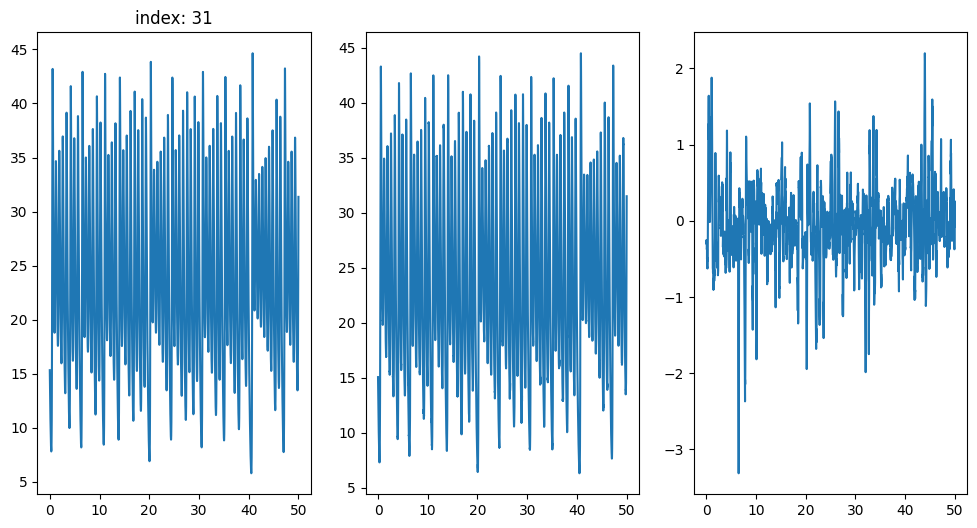

[0.22237293 0.21968717 0.21707984 ... 0.8217604  0.82459352 0.82748392]


<Figure size 640x480 with 0 Axes>

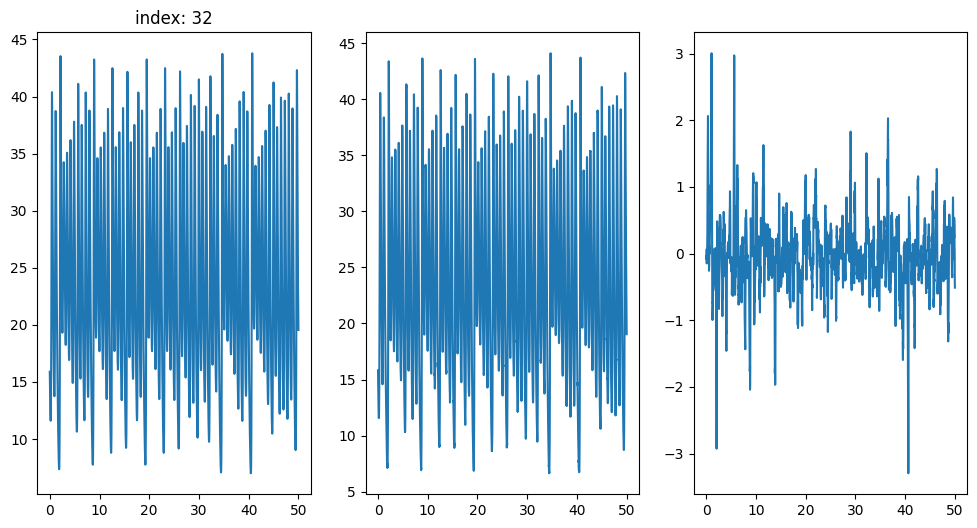

[0.1415699  0.14164327 0.14174903 ... 0.27305707 0.27275967 0.27247886]


<Figure size 640x480 with 0 Axes>

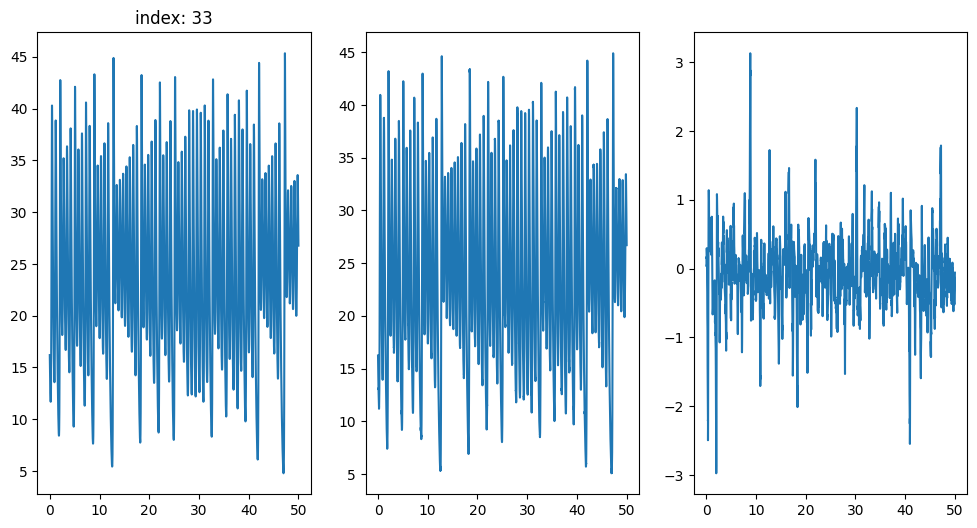

[0.1599531  0.16037805 0.16082906 ... 0.40800493 0.40949247 0.41101256]


<Figure size 640x480 with 0 Axes>

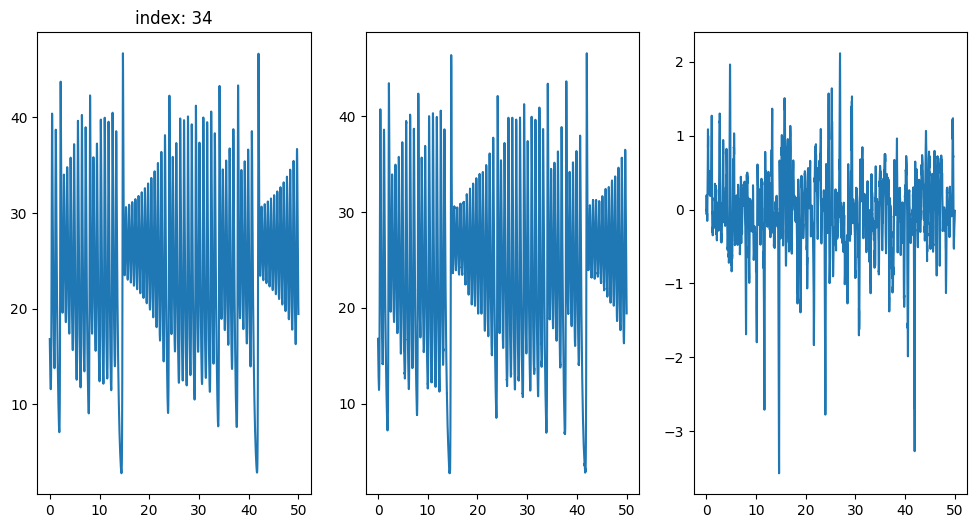

[0.0887245  0.08861992 0.08853697 ... 0.36325558 0.36319449 0.36320176]


<Figure size 640x480 with 0 Axes>

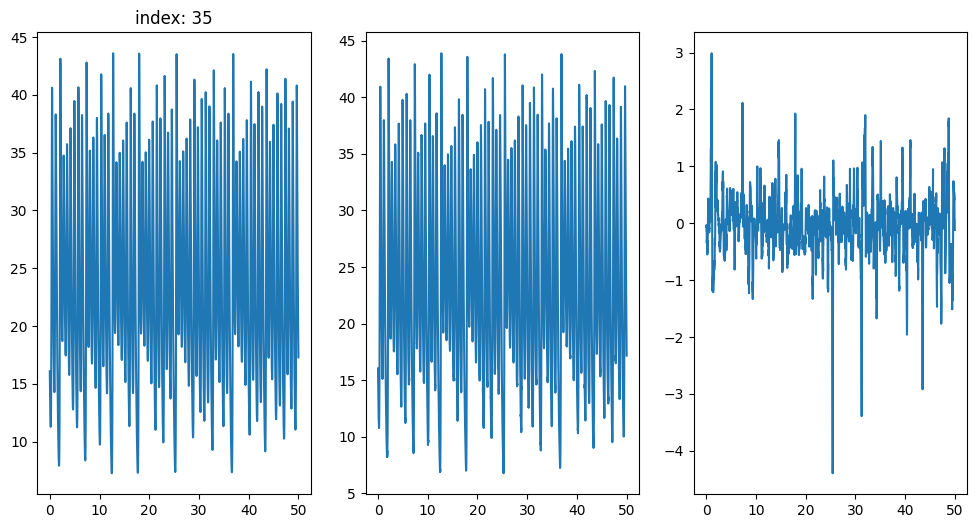

[0.21256928 0.21125954 0.20998222 ... 0.60347    0.60207761 0.60068924]


<Figure size 640x480 with 0 Axes>

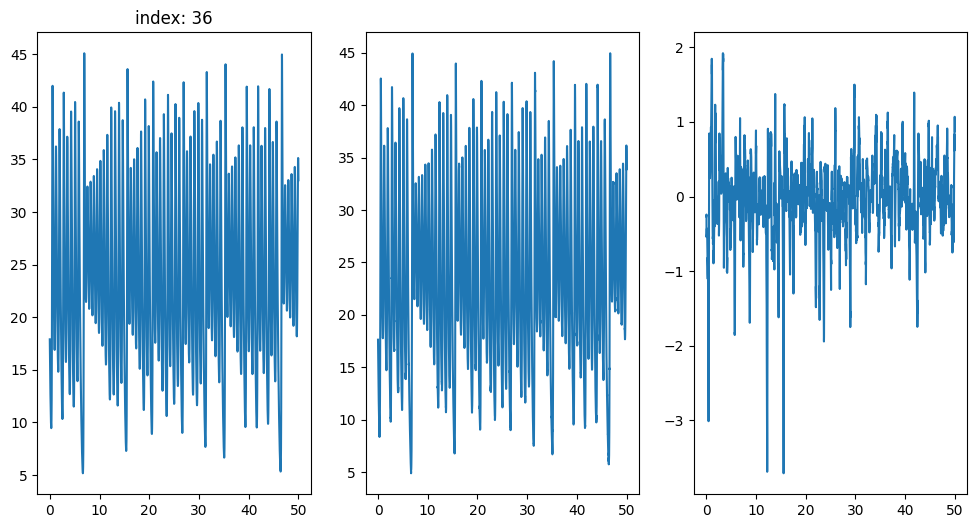

[0.20973474 0.20786692 0.20606121 ... 0.80565756 0.8075078  0.80939835]


<Figure size 640x480 with 0 Axes>

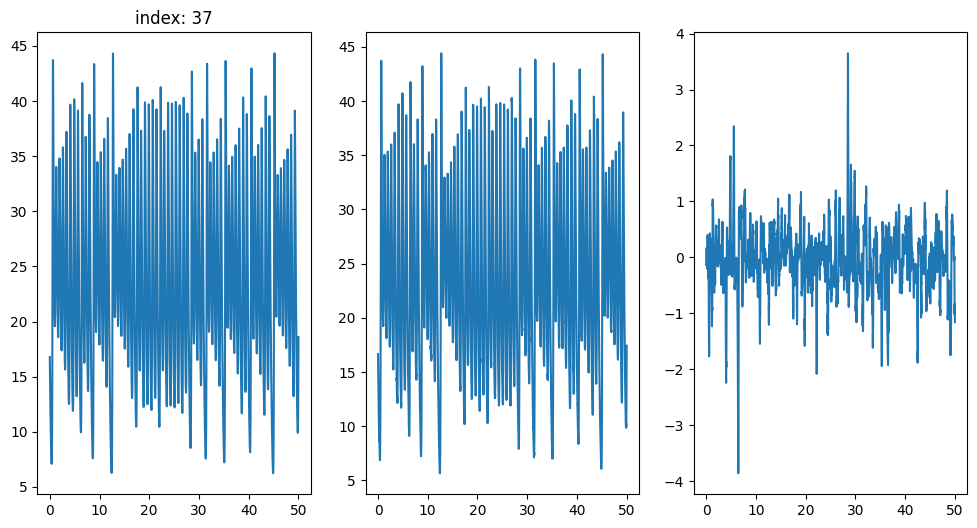

[0.11087048 0.11137726 0.11189135 ... 0.24237739 0.2425346  0.24271435]


<Figure size 640x480 with 0 Axes>

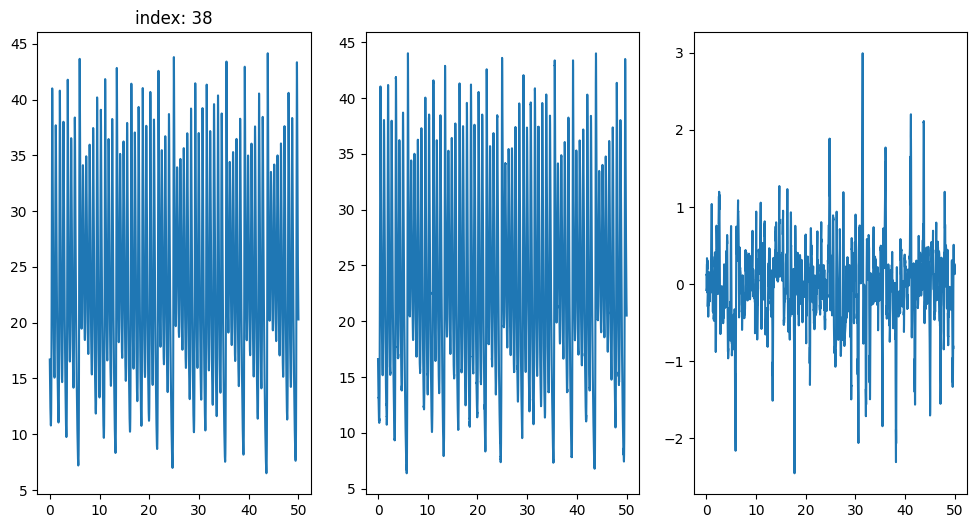

[0.17019404 0.16814209 0.1661358  ... 0.7358527  0.7394323  0.74304682]


<Figure size 640x480 with 0 Axes>

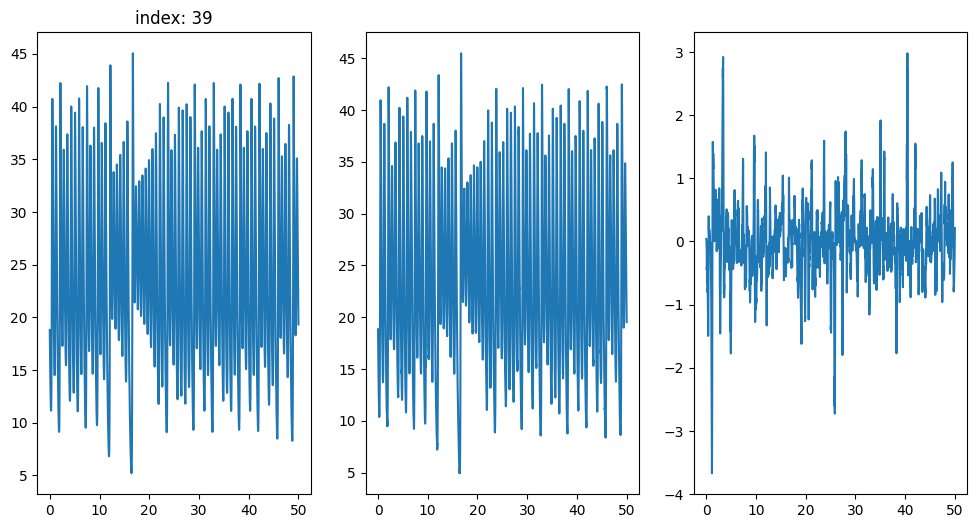

[0.14808867 0.14878067 0.14948079 ... 0.15242349 0.15279558 0.15317107]


<Figure size 640x480 with 0 Axes>

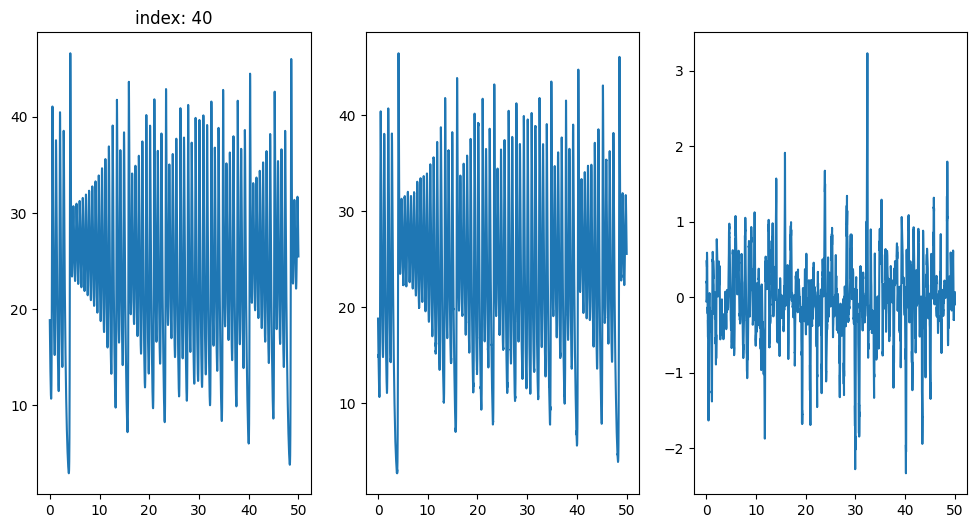

[0.28362426 0.28037833 0.27721577 ... 0.20526935 0.20505014 0.20484628]


<Figure size 640x480 with 0 Axes>

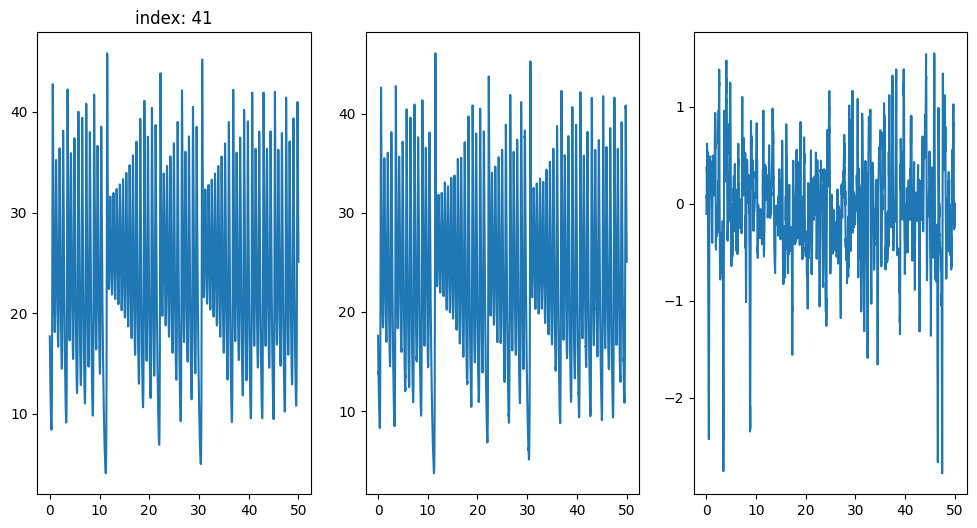

[0.1053061  0.10536827 0.10544754 ... 0.18546963 0.18492123 0.1843744 ]


<Figure size 640x480 with 0 Axes>

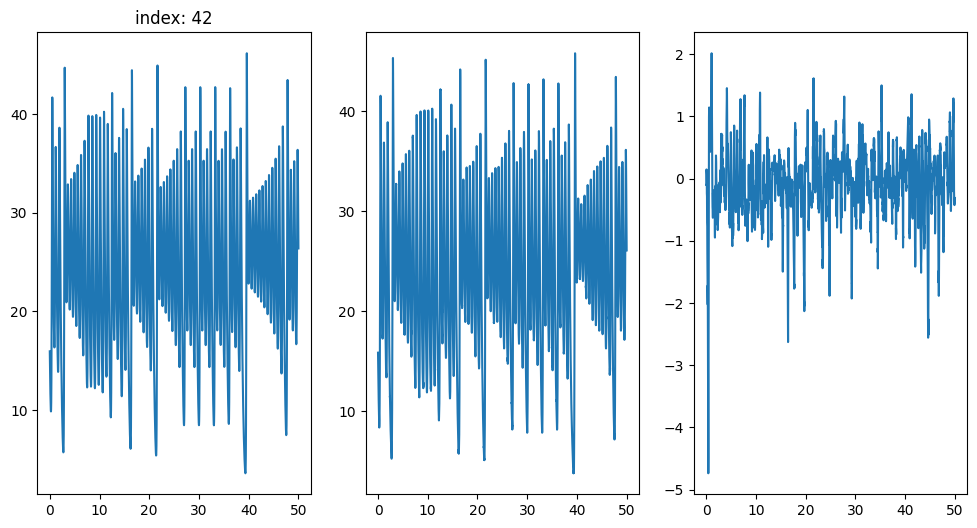

[0.12976066 0.12907114 0.12840413 ... 0.28063688 0.2796727  0.27875021]


<Figure size 640x480 with 0 Axes>

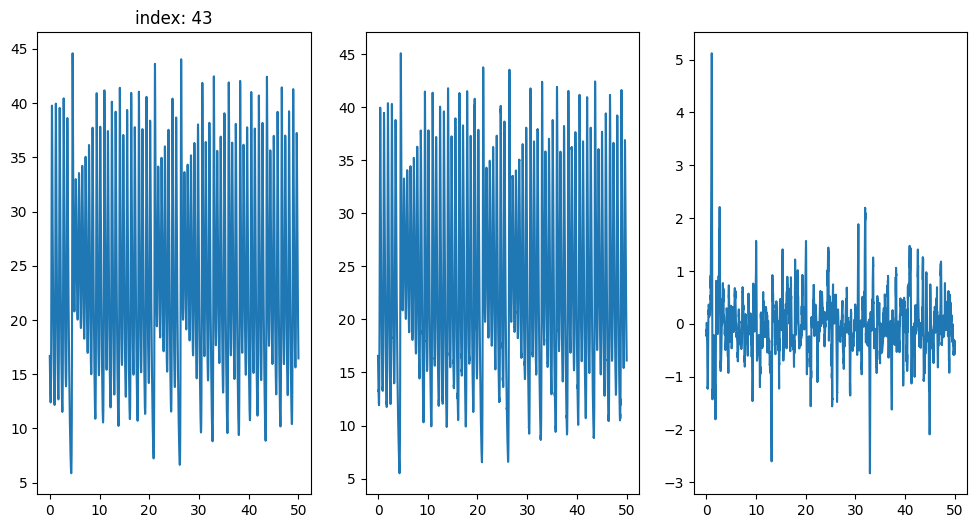

[0.24337169 0.24175537 0.24021571 ... 0.21303122 0.21253306 0.21203293]


<Figure size 640x480 with 0 Axes>

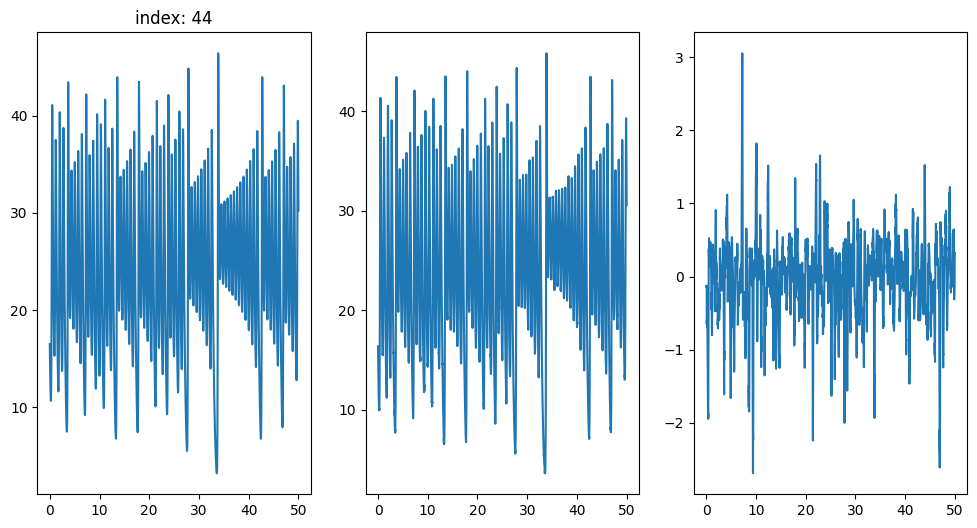

[0.14308633 0.14144695 0.13984825 ... 0.41343653 0.41289727 0.41237109]


<Figure size 640x480 with 0 Axes>

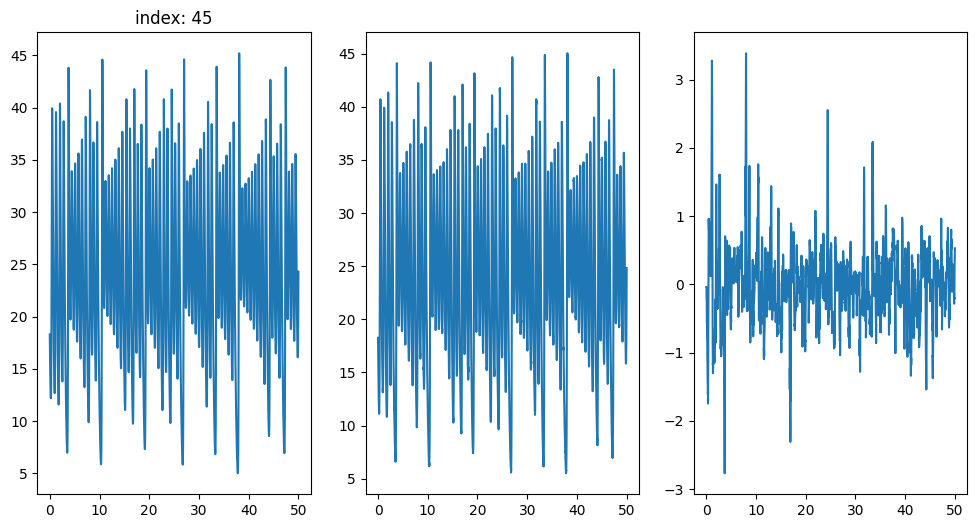

[0.17157492 0.16906292 0.16658986 ... 0.15163779 0.15028032 0.14893311]


<Figure size 640x480 with 0 Axes>

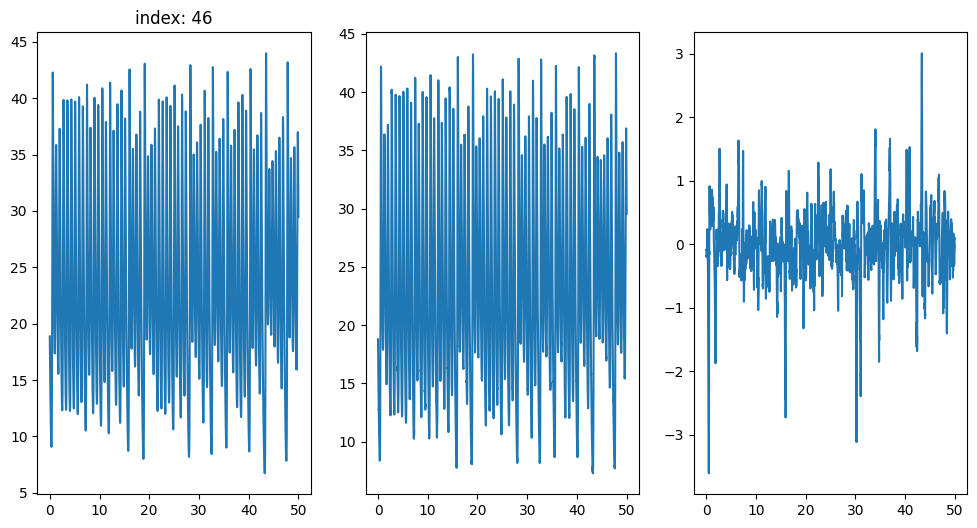

[0.07365676 0.07403164 0.07441076 ... 1.01835168 1.02672522 1.03516999]


<Figure size 640x480 with 0 Axes>

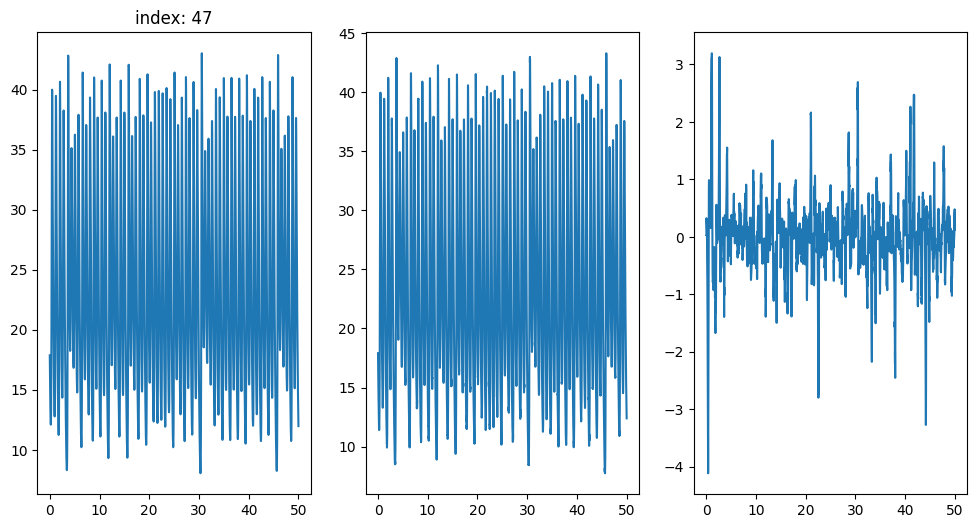

[0.14903129 0.14775628 0.14651875 ... 0.23793816 0.23636103 0.23479466]


<Figure size 640x480 with 0 Axes>

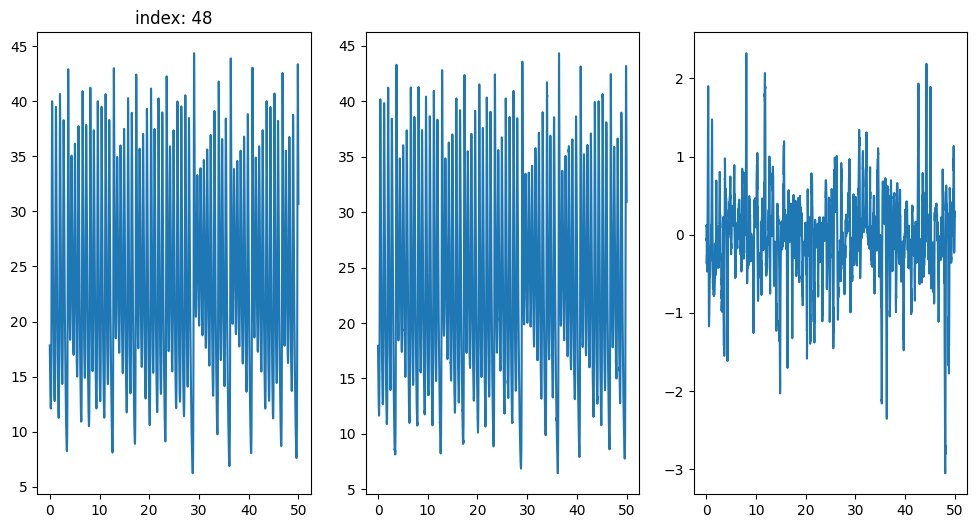

[0.13576491 0.13460646 0.13346817 ... 0.28968685 0.29074816 0.29186156]


<Figure size 640x480 with 0 Axes>

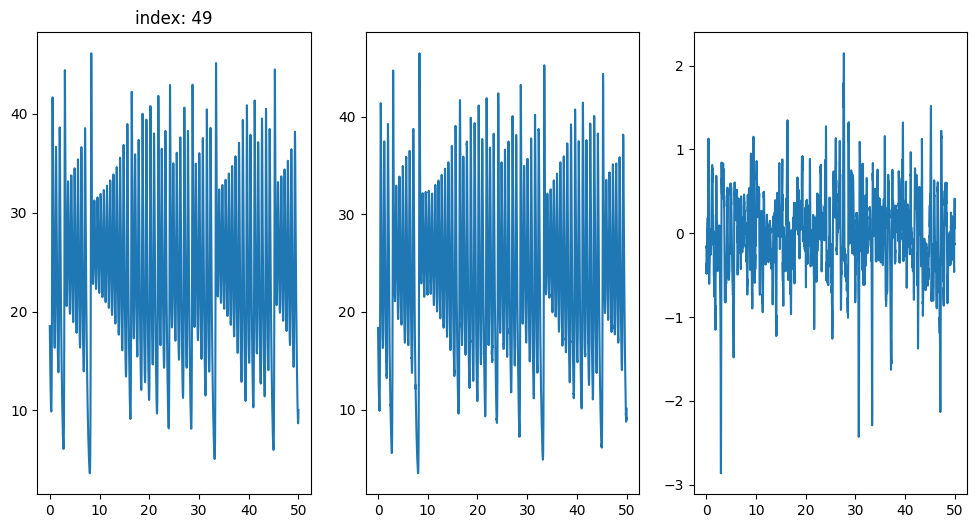

[0.11517919 0.11564164 0.11611499 ... 0.09350504 0.09346104 0.09341977]


<Figure size 640x480 with 0 Axes>

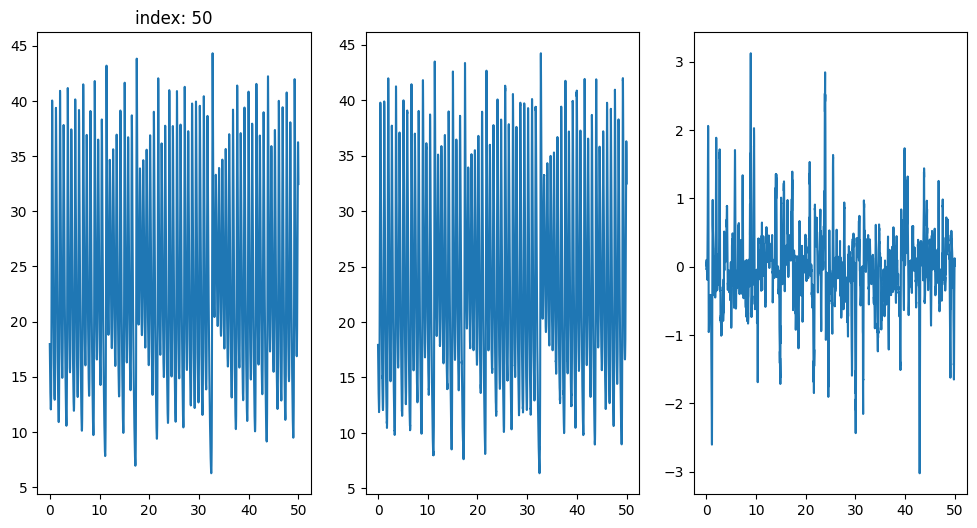

[0.27541647 0.27271661 0.27010729 ... 0.02973025 0.02973003 0.02973253]


<Figure size 640x480 with 0 Axes>

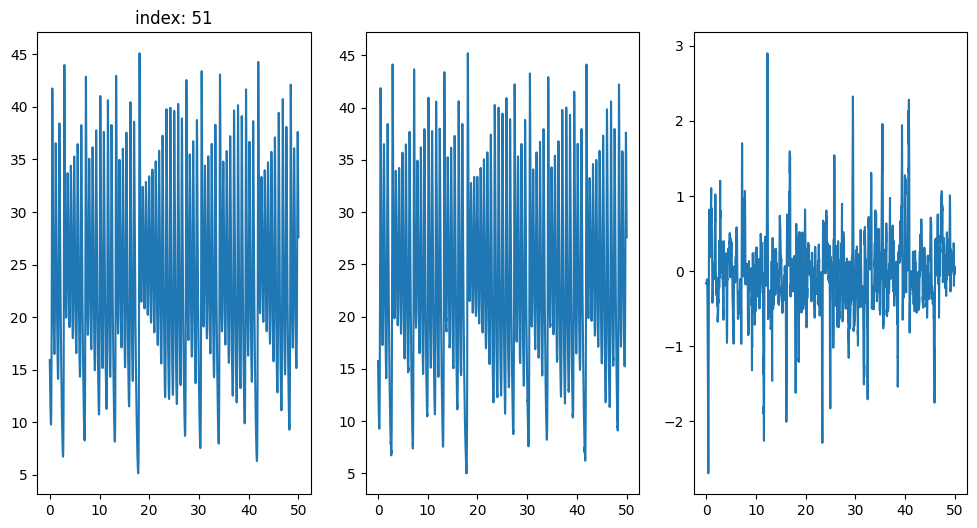

[0.26011943 0.25637234 0.25270489 ... 0.80990374 0.81369341 0.81751331]


<Figure size 640x480 with 0 Axes>

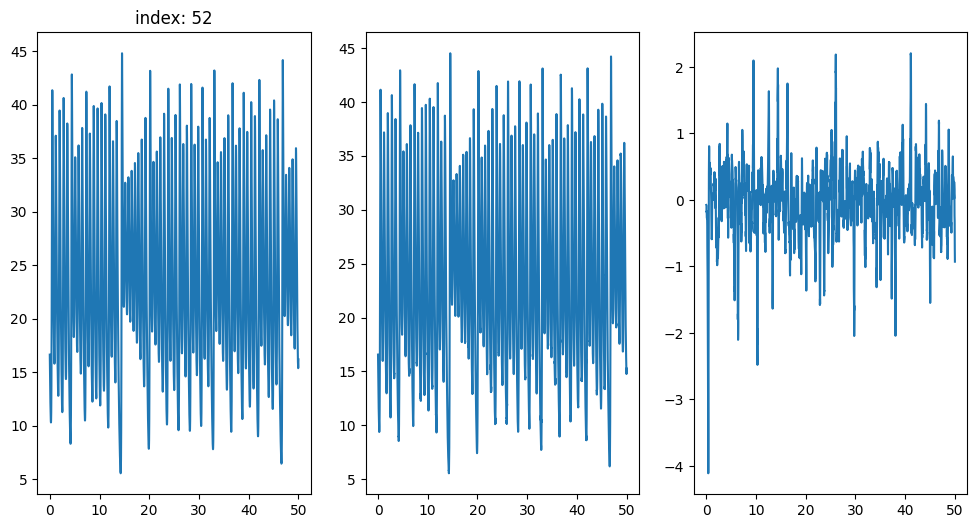

[0.11845965 0.11814497 0.11783153 ... 0.40209172 0.40085691 0.39962212]


<Figure size 640x480 with 0 Axes>

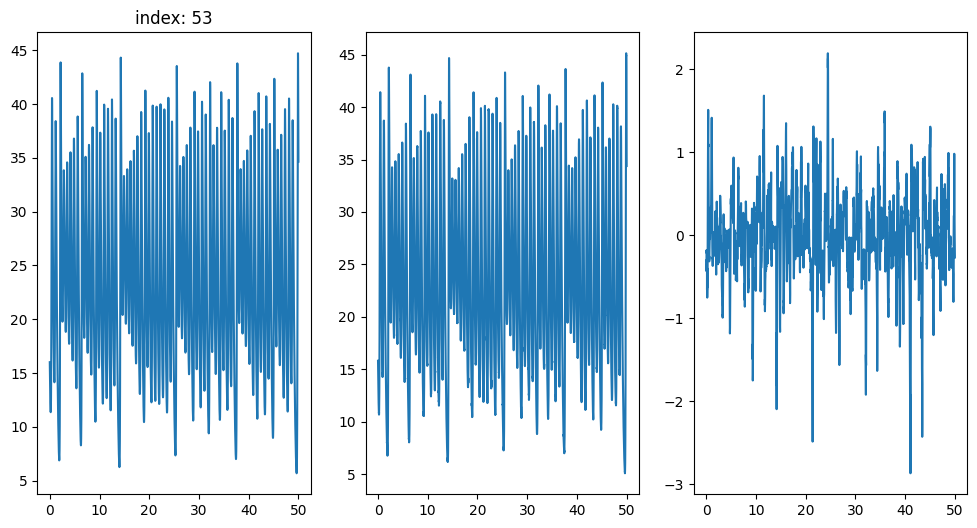

[0.10901708 0.10929407 0.10958186 ... 0.38884963 0.38860952 0.38840122]


<Figure size 640x480 with 0 Axes>

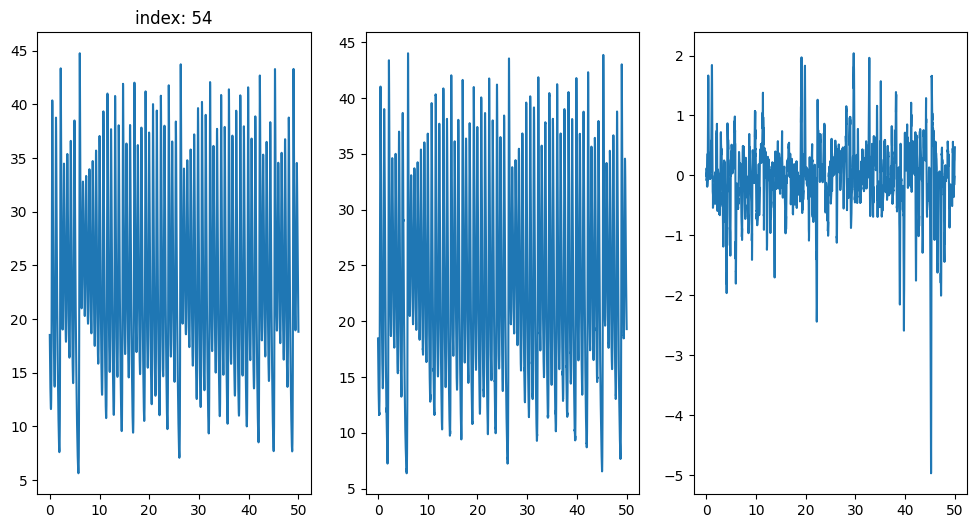

[0.2113638  0.21099558 0.21066884 ... 0.21576111 0.21577931 0.21579106]


<Figure size 640x480 with 0 Axes>

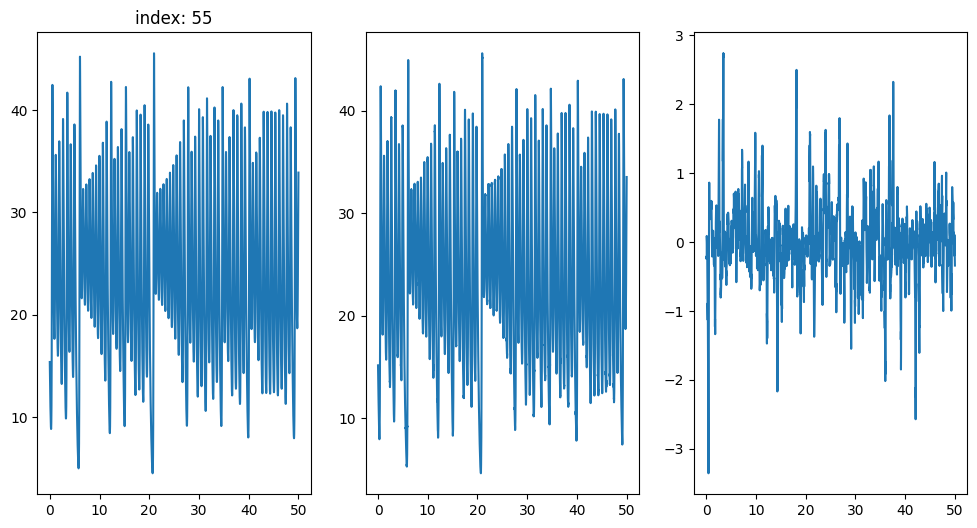

[0.07954458 0.07960499 0.07967211 ... 0.08154389 0.08085326 0.08017436]


<Figure size 640x480 with 0 Axes>

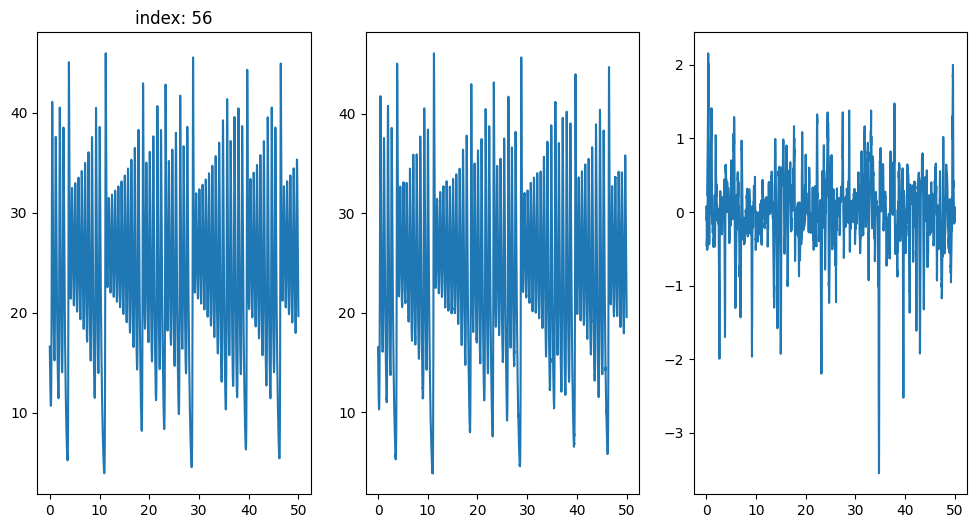

[0.19129874 0.19012956 0.18900576 ... 0.6525723  0.65231124 0.65203032]


<Figure size 640x480 with 0 Axes>

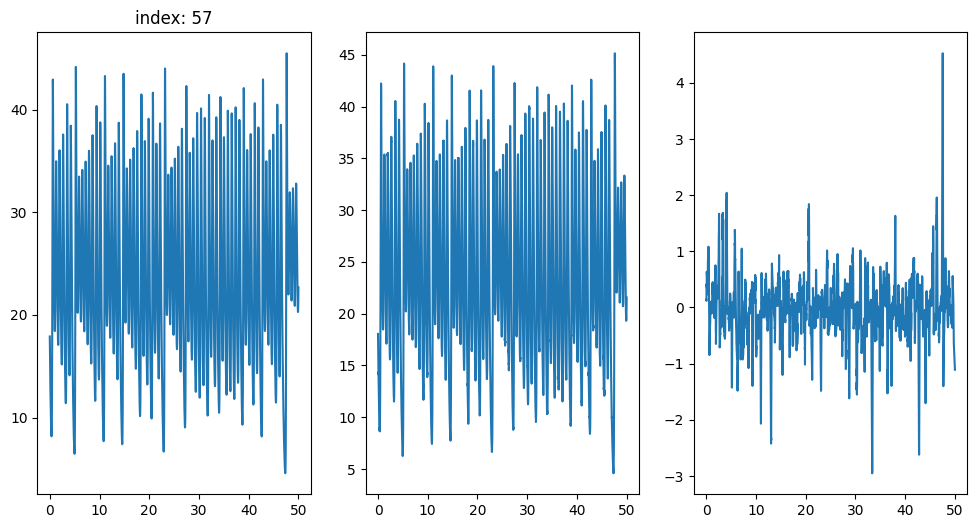

[0.18147275 0.17948979 0.17754212 ... 0.50515362 0.50651694 0.50791102]


<Figure size 640x480 with 0 Axes>

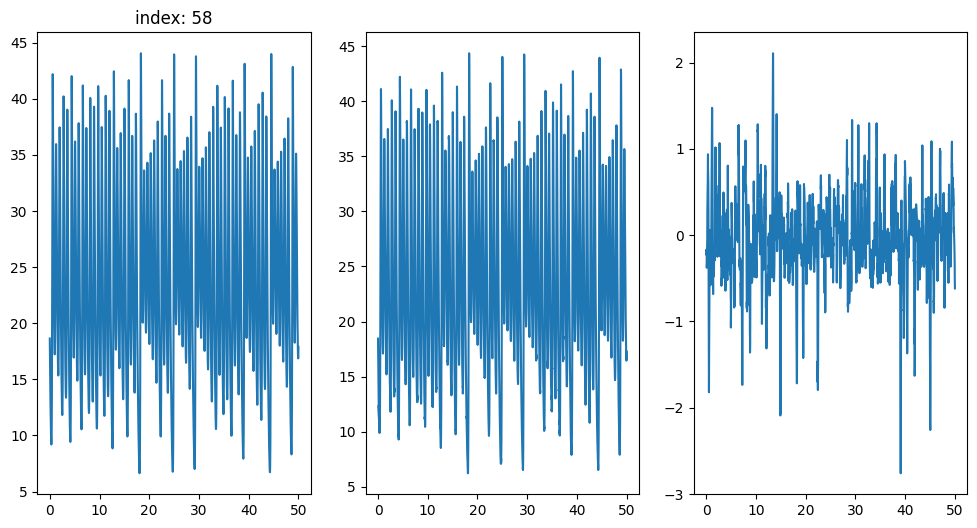

[0.1507747  0.14846081 0.14618569 ... 0.18389325 0.18281281 0.18175078]


<Figure size 640x480 with 0 Axes>

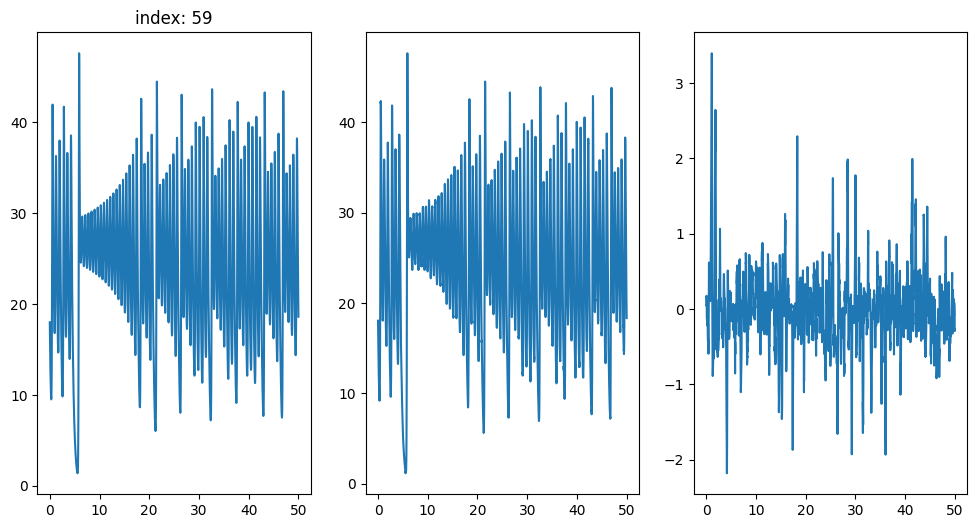

[0.29575644 0.29446971 0.29326019 ... 0.49039722 0.48924943 0.48809083]


<Figure size 640x480 with 0 Axes>

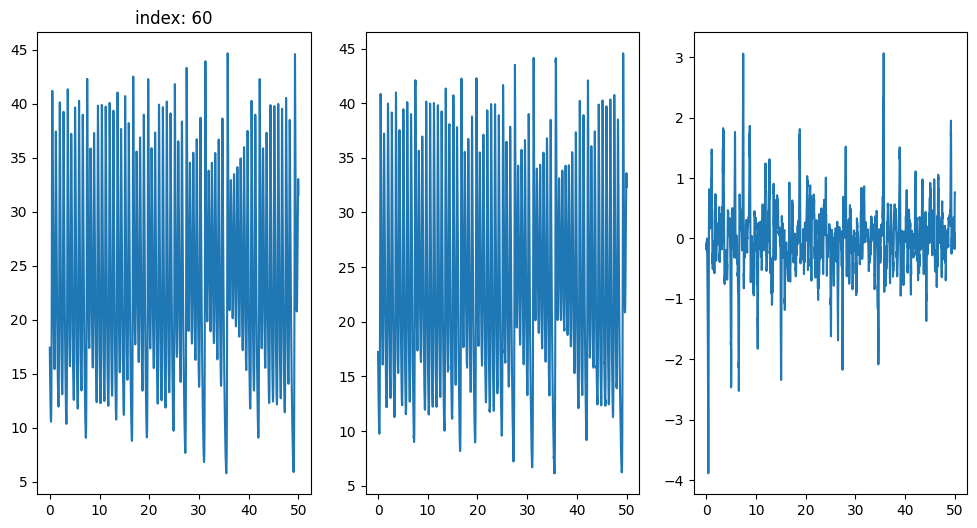

[0.14566602 0.14597953 0.14630331 ... 0.4385869  0.43735957 0.43616275]


<Figure size 640x480 with 0 Axes>

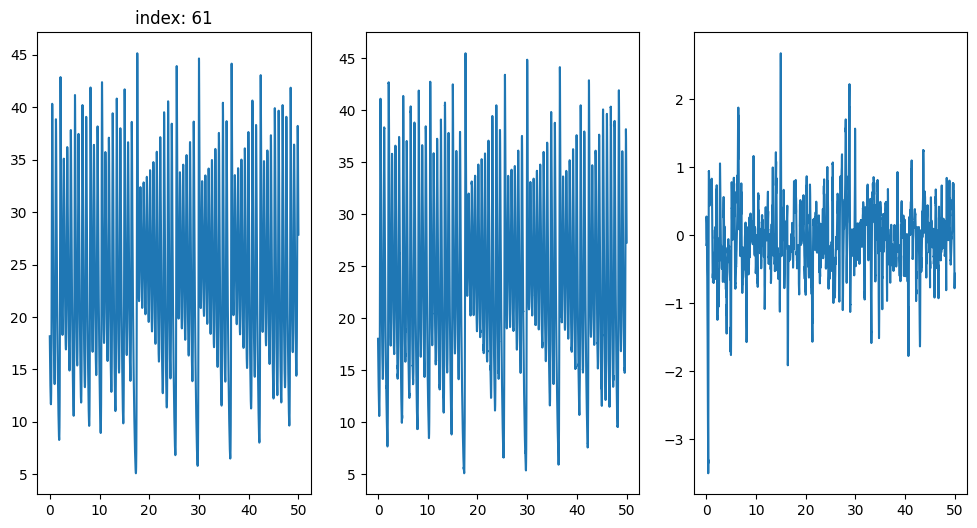

[0.18345515 0.18075902 0.17811712 ... 0.70642602 0.70814485 0.70983589]


<Figure size 640x480 with 0 Axes>

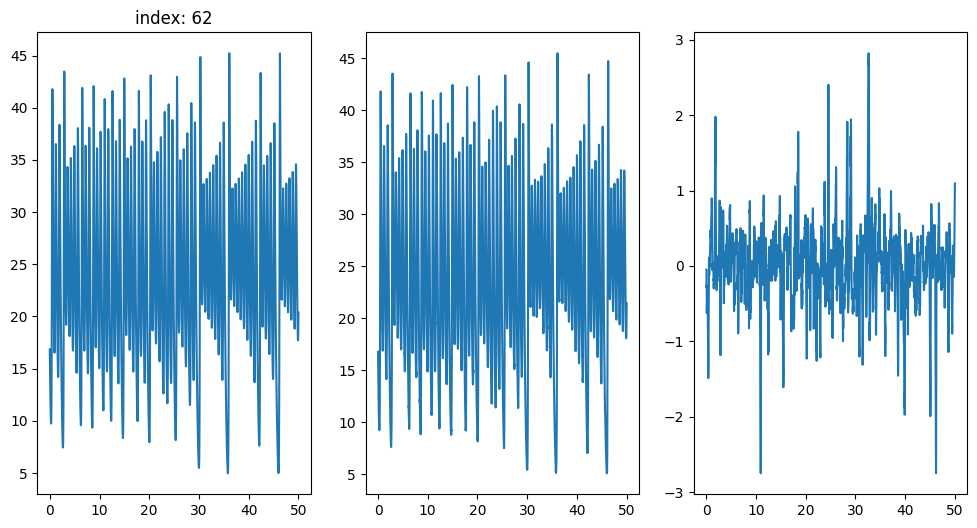

[0.19534279 0.19255572 0.18982045 ... 0.12245103 0.1210137  0.1196171 ]


<Figure size 640x480 with 0 Axes>

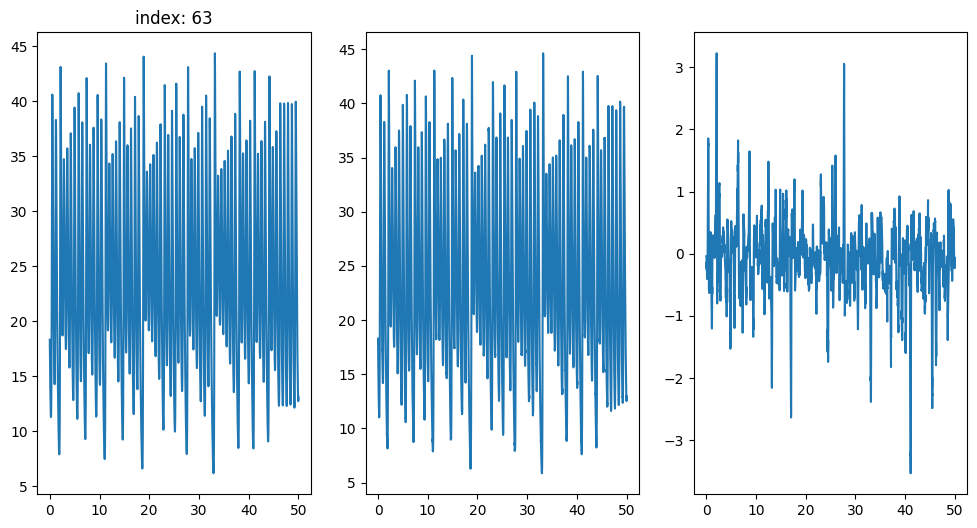

[0.13617628 0.13531727 0.13448836 ... 0.1815998  0.18239886 0.18326686]


<Figure size 640x480 with 0 Axes>

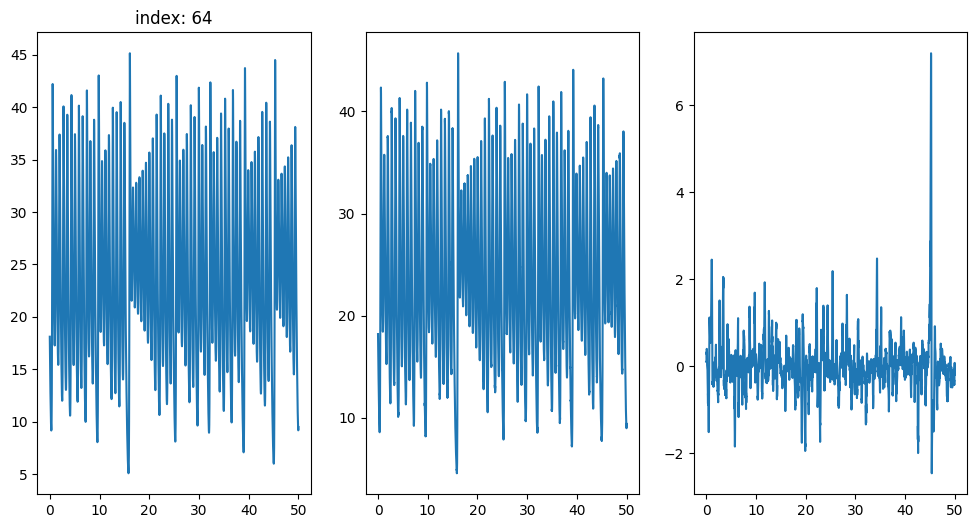

[0.16668507 0.16451897 0.16239589 ... 0.23028986 0.23230857 0.23436401]


<Figure size 640x480 with 0 Axes>

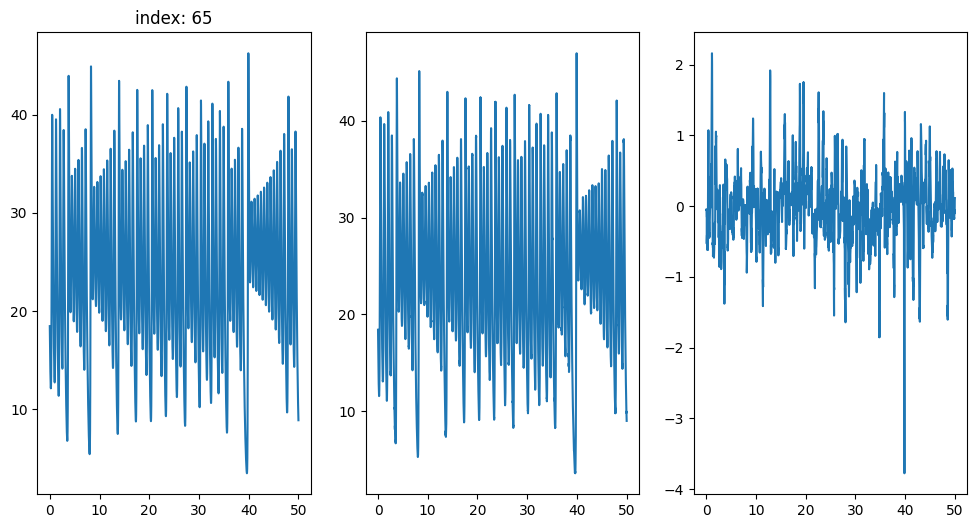

[0.16562554 0.16373635 0.16189243 ... 0.16122333 0.16071696 0.16020823]


<Figure size 640x480 with 0 Axes>

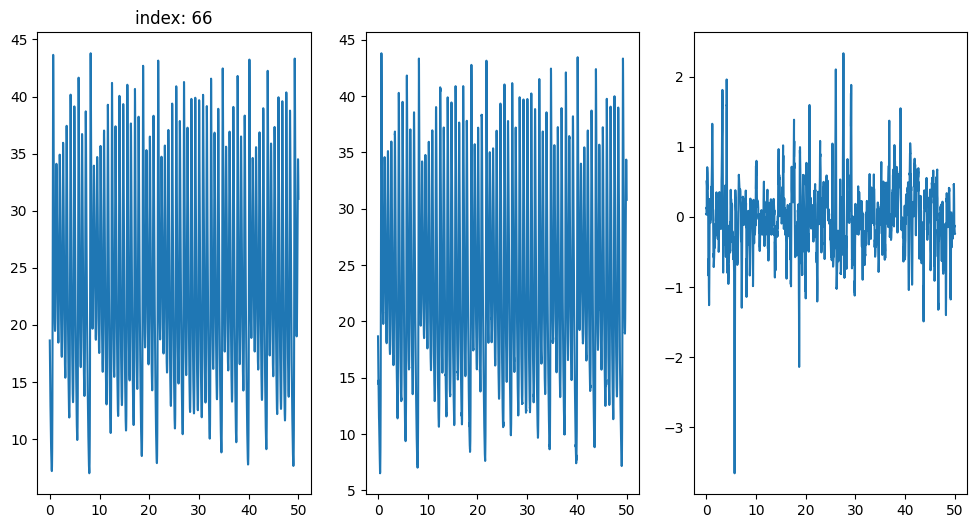

[0.29975591 0.29765532 0.29565064 ... 0.51877736 0.519472   0.5201294 ]


<Figure size 640x480 with 0 Axes>

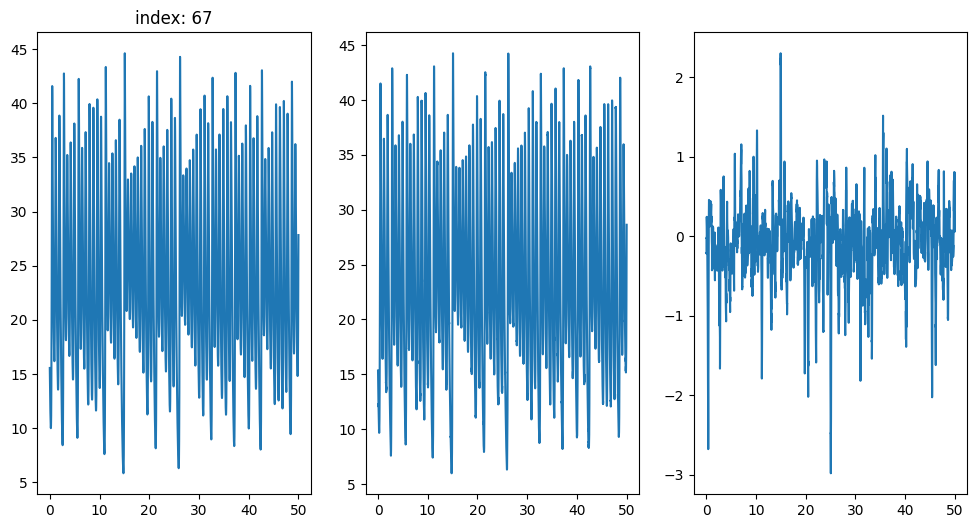

[0.18554943 0.18417483 0.18286213 ... 0.08247211 0.0828717  0.08328314]


<Figure size 640x480 with 0 Axes>

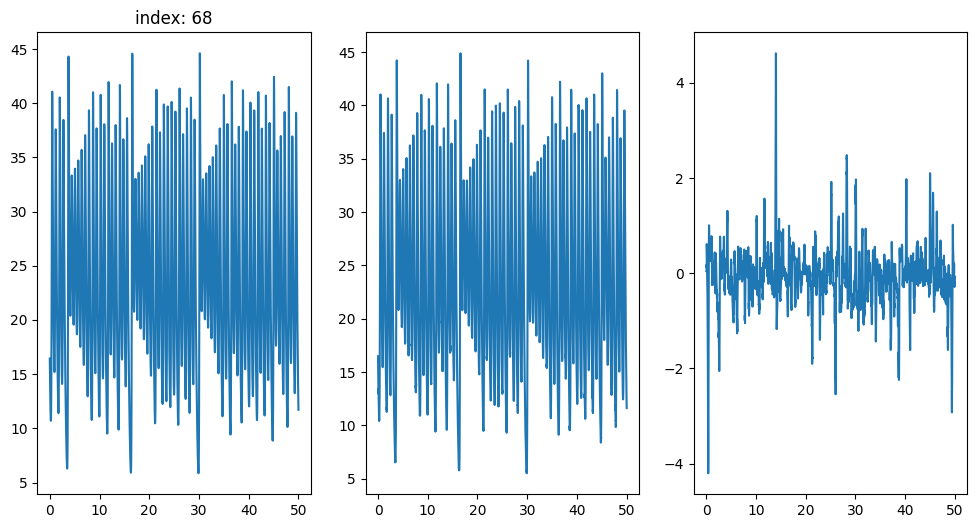

[0.1060346  0.10590109 0.10577414 ... 0.30968647 0.30686268 0.30415424]


<Figure size 640x480 with 0 Axes>

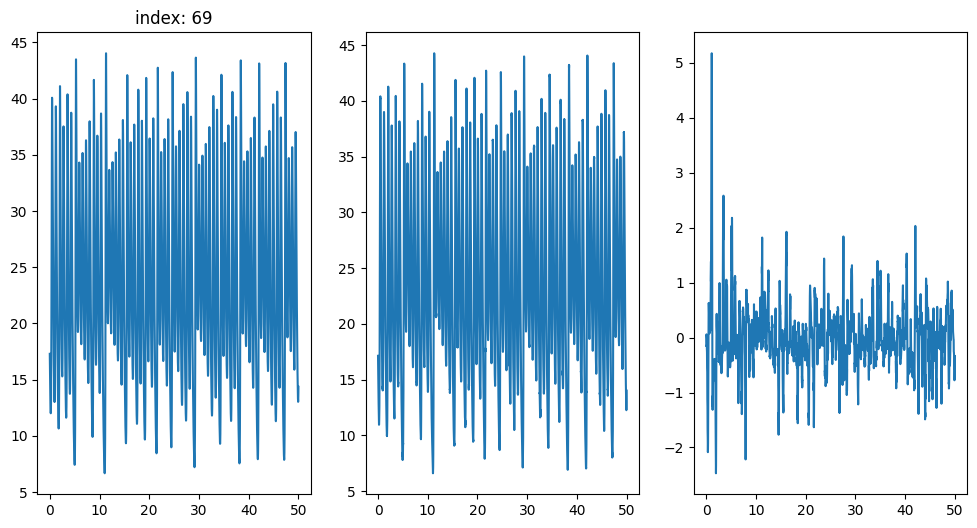

In [5]:

counter = 0
x = np.zeros(int(50000))
y = np.zeros(int(50000))
z = np.zeros(int(50000))

xR = np.zeros(int(50000))
yR = np.zeros(int(50000))
zR = np.zeros(int(50000))

for k in range(70):
    inst = k
    counter = 0
    for i in range(int(1000)):
        for j in range(50):
            if j<50-1:
                x[counter] = sol2[i, inst, j*6 + 3]
                y[counter] = sol2[i, inst, j*6 + 4]
                z[counter] = sol2[i, inst, j*6 + 5]
            else:
                x[counter] = sol2[i, inst, -3]
                y[counter] = sol2[i, inst, -2]
                z[counter] = sol2[i, inst, -1]
            
            xR[counter] = solR[i, inst, j*3 + 0]
            yR[counter] = solR[i, inst, j*3 + 1]
            zR[counter] = solR[i, inst, j*3 + 2]
            counter += 1

    RMSE = (1/np.sqrt(3))*np.sqrt((x-xR)**2 + (y-yR)**2 + (z-zR)**2)
    print(RMSE)


    t1 = np.arange(0, 50, 0.001)

    plt.clf()
    plt.figure(figsize=(12, 6))
    fig1 = plt.gcf()

    plt.subplot(1, 3, 2)
    plt.plot(t1, z)  # Plot some data on the axes.
    # plt.xlim((0, 1700))
    plt.subplot(1, 3, 1)
    plt.plot(t1, zR)  # Plot some data on the axes.
    plt.title('index: ' + str(k))
    # plt.xlim((0, 1700))
    plt.subplot(1, 3, 3)
    plt.plot(t1, z-zR)  # Plot some data on the axes.
    plt.show()


<Figure size 640x480 with 0 Axes>

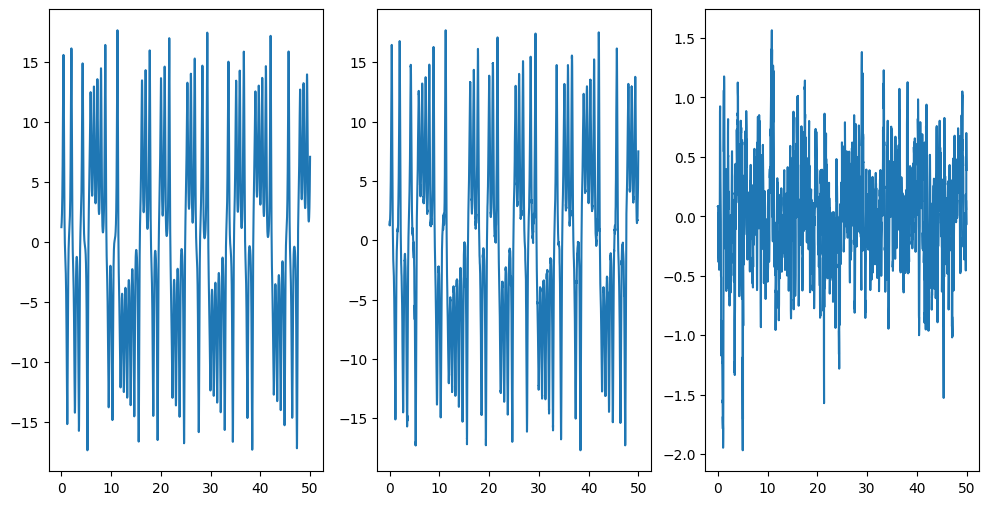

In [6]:

plt.clf()
plt.figure(figsize=(12, 6))
fig1 = plt.gcf()

plt.subplot(1, 3, 2)
plt.plot(t1, x)  # Plot some data on the axes.
# plt.xlim((0, 1700))
plt.subplot(1, 3, 1)
plt.plot(t1, xR)  # Plot some data on the axes.
# plt.xlim((0, 1700))
plt.subplot(1, 3, 3)
plt.plot(t1, x-xR)  # Plot some data on the axes.
plt.show()


<Figure size 640x480 with 0 Axes>

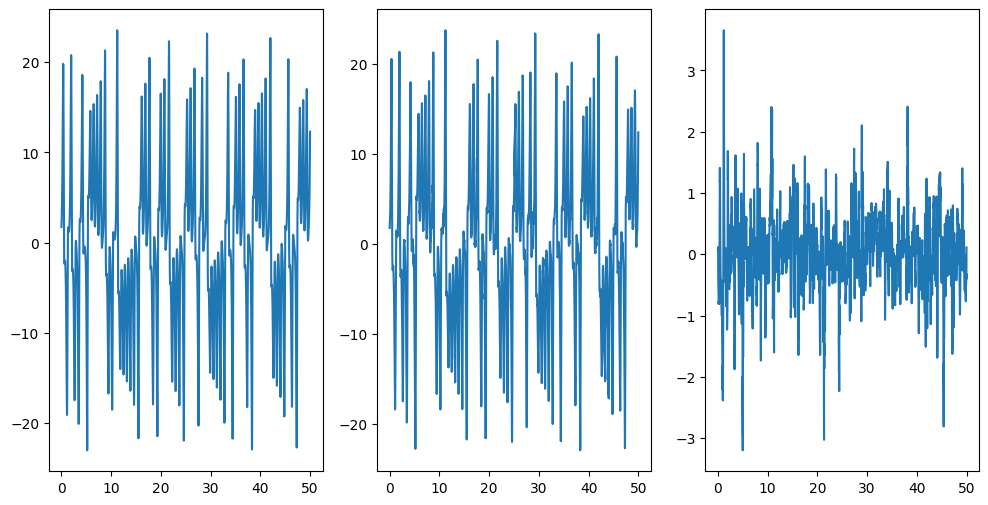

In [7]:

plt.clf()
plt.figure(figsize=(12, 6))
fig1 = plt.gcf()

plt.subplot(1, 3, 2)
plt.plot(t1, y)  # Plot some data on the axes.
# plt.xlim((0, 1700))
plt.subplot(1, 3, 1)
plt.plot(t1, yR)  # Plot some data on the axes.
# plt.xlim((0, 1700))
plt.subplot(1, 3, 3)
plt.plot(t1, y-yR)  # Plot some data on the axes.
plt.show()


In [8]:
# model.save('data2/'+'neurons'+str(neuron)+'_LR'+str(lr)+'_Gamma'+str(gamma)+'_BS'+str(bs)+'_totSteps'+str(tSteps)+'_assimStep50_obsNosie1.0_maxgradnorm'+str(max_grad_norms)+'_vfcoeff'+str(vf)+'/PPO_Gaussian_lossDifference_AssimXY_GaussianNoise_every50')

# np.savez('data2/'+'neurons'+str(neuron)+'_LR'+str(lr)+'_Gamma'+str(gamma)+'_BS'+str(bs)+'_totSteps'+str(tSteps)+'_assimStep50_obsNosie1.0_maxgradnorm'+str(max_grad_norms)+'_vfcoeff'+str(vf)+'/sol2', sol2=sol2)
# np.savez('data2/'+'neurons'+str(neuron)+'_LR'+str(lr)+'_Gamma'+str(gamma)+'_BS'+str(bs)+'_totSteps'+str(tSteps)+'_assimStep50_obsNosie1.0_maxgradnorm'+str(max_grad_norms)+'_vfcoeff'+str(vf)+'/solR', solR=solR)

# np.savez('data2/'+'neurons'+str(neuron)+'_LR'+str(lr)+'_Gamma'+str(gamma)+'_BS'+str(bs)+'_totSteps'+str(tSteps)+'_assimStep50_obsNosie1.0_maxgradnorm'+str(max_grad_norms)+'_vfcoeff'+str(vf)+'/pred', x=x, y=y, z=z)
# np.savez('data2/'+'neurons'+str(neuron)+'_LR'+str(lr)+'_Gamma'+str(gamma)+'_BS'+str(bs)+'_totSteps'+str(tSteps)+'_assimStep50_obsNosie1.0_maxgradnorm'+str(max_grad_norms)+'_vfcoeff'+str(vf)+'/ref',  xR=xR, yR=yR, zR=zR)


In [9]:
model.save('dataAction/'+'neurons'+str(neuron)+'_LR'+str(lr)+'_Gamma'+str(gamma)+'_BS'+str(bs)+'_totSteps'+str(tSteps)+'_assimStep50_obsNosie1.0_maxgradnorm'+str(max_grad_norms)+'_vfcoeff'+str(vf)+'/PPO_Gaussian_lossDifference_AssimXY_GaussianNoise_every50')

np.savez('dataAction/'+'neurons'+str(neuron)+'_LR'+str(lr)+'_Gamma'+str(gamma)+'_BS'+str(bs)+'_totSteps'+str(tSteps)+'_assimStep50_obsNosie1.0_maxgradnorm'+str(max_grad_norms)+'_vfcoeff'+str(vf)+'/sol2', sol2=sol2)
np.savez('dataAction/'+'neurons'+str(neuron)+'_LR'+str(lr)+'_Gamma'+str(gamma)+'_BS'+str(bs)+'_totSteps'+str(tSteps)+'_assimStep50_obsNosie1.0_maxgradnorm'+str(max_grad_norms)+'_vfcoeff'+str(vf)+'/solR', solR=solR)

np.savez('dataAction/'+'neurons'+str(neuron)+'_LR'+str(lr)+'_Gamma'+str(gamma)+'_BS'+str(bs)+'_totSteps'+str(tSteps)+'_assimStep50_obsNosie1.0_maxgradnorm'+str(max_grad_norms)+'_vfcoeff'+str(vf)+'/pred', x=x, y=y, z=z)
np.savez('dataAction/'+'neurons'+str(neuron)+'_LR'+str(lr)+'_Gamma'+str(gamma)+'_BS'+str(bs)+'_totSteps'+str(tSteps)+'_assimStep50_obsNosie1.0_maxgradnorm'+str(max_grad_norms)+'_vfcoeff'+str(vf)+'/ref',  xR=xR, yR=yR, zR=zR)


/data1/RL/test_recallWhatIdid/PerfectModels_testNoise/Full_MDP_allobserved/stable-baselines3/stable_baselines3/common/save_util.py:278: UserWarning: Path 'dataAction/neurons128_LR0.0001_Gamma0.9_BS100_totSteps5000000_assimStep50_obsNosie1.0_maxgradnorm0.9_vfcoeff0.8' does not exist. Will create it.
  warnings.warn(f"Path '{path.parent}' does not exist. Will create it.")


In [10]:
# model.save('dataActionEns/'+'neurons'+str(neuron)+'_LR'+str(lr)+'_Gamma'+str(gamma)+'_BS'+str(bs)+'_totSteps'+str(tSteps)+'_assimStep50_obsNosie1.0_maxgradnorm'+str(max_grad_norms)+'_vfcoeff'+str(vf)+'/PPO_Gaussian_lossDifference_AssimXY_GaussianNoise_every50')

# np.savez('dataActionEns/'+'neurons'+str(neuron)+'_LR'+str(lr)+'_Gamma'+str(gamma)+'_BS'+str(bs)+'_totSteps'+str(tSteps)+'_assimStep50_obsNosie1.0_maxgradnorm'+str(max_grad_norms)+'_vfcoeff'+str(vf)+'/sol2', sol2=sol2)
# np.savez('dataActionEns/'+'neurons'+str(neuron)+'_LR'+str(lr)+'_Gamma'+str(gamma)+'_BS'+str(bs)+'_totSteps'+str(tSteps)+'_assimStep50_obsNosie1.0_maxgradnorm'+str(max_grad_norms)+'_vfcoeff'+str(vf)+'/solR', solR=solR)

# np.savez('dataActionEns/'+'neurons'+str(neuron)+'_LR'+str(lr)+'_Gamma'+str(gamma)+'_BS'+str(bs)+'_totSteps'+str(tSteps)+'_assimStep50_obsNosie1.0_maxgradnorm'+str(max_grad_norms)+'_vfcoeff'+str(vf)+'/pred', x=x, y=y, z=z)
# np.savez('dataActionEns/'+'neurons'+str(neuron)+'_LR'+str(lr)+'_Gamma'+str(gamma)+'_BS'+str(bs)+'_totSteps'+str(tSteps)+'_assimStep50_obsNosie1.0_maxgradnorm'+str(max_grad_norms)+'_vfcoeff'+str(vf)+'/ref',  xR=xR, yR=yR, zR=zR)
